# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

#### In this project we will try to find an optimal location for a restaurant. Specifically, this report will be targeted to stakeholders interested in opening a Vegetarian restaurant in Chennai, Tamilnadu, India. Since there are lots of restaurants in Chennai we will try to detect locations that are not already crowded with restaurants. We are also particularly interested in areas with no Vegetarian restaurants in the city we chosen. We would also prefer locations as close to city center as possible, assuming that first two conditions are met. We will use our data science powers to generate a few most promising neighbourhoods based on these criteria. Advantages of each area will then be clearly expressed so that best possible final location can be chosen by stakeholders.


## Data <a name="data"></a>

#### Based on definition of our problem, factors that will influence our decission are:
* number of existing restaurants in the neighborhood (any type of restaurant)
* number of and distance to Vegetarian  restaurants in the neighborhood, if any
* distance of neighborhood from city center

#### We decided to use regularly spaced grid of locations, centered around city center, to define our neighborhoods.

#### Following data sources will be needed to extract/generate the required information:
* centers of candidate areas will be generated algorithmically and approximate addresses of centers of those areas will be obtained using **Google Maps API reverse geocoding**
* number of restaurants and their type and location in every neighborhood will be obtained using **Foursquare API**
* coordinate of Chennai center will be obtained using **Google Maps API geocoding** of well known Chennai location (Annanagar)

### Neighborhood Candidates

#### Let's create latitude & longitude coordinates for centroids of our candidate neighborhoods. We will create a grid of cells covering our area of interest which is aprox. 12x12 killometers centered around Chennai city center.

#### Let's first find the latitude & longitude of Chennai city center, using specific, well known address and Google Maps geocoding API.

In [1]:
#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

In [2]:
address = 'Anna Nagar 6th avenue, Chennai, Tamilnadu, India'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
#cord = str(latitude) + "," + str(longitude)
print('The geograpical coordinate of Chennai City are {}, {}.'.format(latitude, longitude))
#geolocator1 = Nominatim(user_agent="ny_explorer")
#loc3= geolocator1.reverse(cord)
#print(loc3.address)

The geograpical coordinate of Chennai City are 13.0923676, 80.2150924.


In [3]:

geolocator = Nominatim(user_agent="ny_explorer")
loc2 = geolocator.reverse("13.0923676, 80.2150924")
print(loc2.address)


Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600060, India


In [4]:
!pip install shapely
import shapely.geometry

!pip install pyproj
import pyproj

import math

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

print('Coordinate transformation check')
print('-------------------------------')
print('Anna Nagar center longitude={}, latitude={}'.format(location.longitude, location.latitude))
x, y = lonlat_to_xy(location.longitude, location.latitude)
print('Anna Nagar center UTM X={}, Y={}'.format(x, y))
lo, la = xy_to_lonlat(x, y)
print('Anna Nagar center longitude={}, latitude={}'.format(lo, la))

     |████████████████████████████████| 1.8MB 9.0MB/s eta 0:00:01
     |████████████████████████████████| 10.9MB 7.9MB/s eta 0:00:01
Coordinate transformation check
-------------------------------
Anna Nagar center longitude=80.2150924, latitude=13.0923676
Anna Nagar center UTM X=9411416.086927421, Y=3243236.5053727515
Anna Nagar center longitude=80.21509239986086, latitude=13.092367599927062


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


#### Now let's create a grid of area candidates, equaly spaced, centered around city center and within ~6km from Chennai(Annanagar). Our neighborhoods will be defined as circular areas with a radius of 300 meters, so our neighborhood centers will be 600 meters apart.

#### To accurately calculate distances we need to create our grid of locations in Cartesian 2D coordinate system which allows us to calculate distances in meters (not in latitude/longitude degrees). Then we'll project those coordinates back to latitude/longitude degrees to be shown on Folium map. So let's create functions to convert between WGS84 spherical coordinate system (latitude/longitude degrees) and UTM Cartesian coordinate system (X/Y coordinates in  meters).

#### Let's create a **hexagonal grid of cells**: we offset every other row, and adjust vertical row spacing so that **every cell center is equally distant from all it's neighbors**.

In [5]:
berlin_center_x, berlin_center_y = lonlat_to_xy(location.longitude, location.latitude) # City center in Cartesian coordinates

k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_min = berlin_center_x - 6000
x_step = 600
y_min = berlin_center_y - 6000 - (int(21/k)*k*600 - 12000)/2
y_step = 600 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(21/k)):
    y = y_min + i * y_step
    x_offset = 300 if i%2==0 else 0
    for j in range(0, 21):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(berlin_center_x, berlin_center_y, x, y)
        
        if (distance_from_center <= 6001):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)
print(distances_from_center)
print(len(latitudes), 'candidate neighborhood centers generated.')

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

[5992.495306631506, 5840.3767001795895, 5747.173218200459, 5715.767664977349, 5747.173218200459, 5840.3767001795895, 5992.495306631506, 5855.7663887829085, 5604.462507680789, 5408.32691319595, 5273.518749374049, 5204.8054718692065, 5204.8054718692065, 5273.518749374049, 5408.32691319595, 5604.462507680789, 5855.7663887829085, 5901.694671872071, 5556.077753235927, 5256.424640380873, 5010.987926547337, 4828.0430818296545, 4714.870093650851, 4676.537180436309, 4714.870093650851, 4828.0430818296545, 5010.987926547337, 5256.424640380873, 5556.077753235927, 5901.694671872071, 5700.000000000183, 5307.541803886436, 4956.813492557702, 4657.252408878231, 4419.275958797107, 4253.234063627593, 4167.733196835192, 4167.733196835192, 4253.234063627593, 4419.275958797107, 4657.252408878231, 4956.813492557702, 5307.541803886436, 5700.000000000183, 5556.077753235746, 5117.616632769709, 4714.870093650638, 4357.75171390032, 4058.32477754075, 3830.143600441265, 3686.461718233512, 3637.306695894804, 3686.46

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

#### Let's visualize the data we have so far: city center location and candidate neighborhood centers:

In [6]:
!pip install folium

import folium

     |████████████████████████████████| 102kB 8.2MB/s ta 0:00:011


In [7]:
map_berlin = folium.Map(location=[location.latitude, location.longitude], zoom_start=11)
folium.Marker([location.latitude, location.longitude], popup='Anna Nagar').add_to(map_berlin)
for lat, lon in zip(latitudes, longitudes):
    #folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin) 
    folium.Circle([lat, lon], radius=300, color='blue', fill=False).add_to(map_berlin)
    #folium.Marker([lat, lon]).add_to(map_berlin)
map_berlin

#### OK, we now have the coordinates of centers of neighborhoods/areas to be evaluated, equally spaced (distance from every point to it's neighbors is exactly the same) and within ~6km from Chennai ( Annanagar). 

#### Let's now  get approximate addresses of those locations.

In [8]:
print('Obtaining location addresses: ', end='')
addresses = []
for lat, lon in zip(latitudes, longitudes):
    cord = str(lat) + "," + str(lon)
    geolocator2 = Nominatim(user_agent="ny_explorer")
    loc4= geolocator2.reverse(cord)
    print(loc4.address)
    if address is None:
        address = 'NO ADDRESS'
    addresses.append(loc4.address)
    print(' .', end='')
print(' done.')

Obtaining location addresses: Ward 127, Zone 10 Kodambakkam, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 .Ward 127, Zone 10 Kodambakkam, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 .Ward 127, Zone 10 Kodambakkam, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 .Adayar Ananda Bhavan (A2B), Jawaharlal Nehru Road (100 Feet Road), Ward 127, Zone 10 Kodambakkam, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 .Ward 127, Zone 10 Kodambakkam, சென்னை - Chennai, Chennai district, Tamil Nadu, 600107, India
 .Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600107, India
 .Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600107, India
 .Ward 90, Zone 7 Ambattur, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 .St. Peter & St.Paul's Orthodox Church, Thirumangalam Causeway, Ward 90, Zone 7 Ambattur, சென்னை - Chennai, Chennai district, Tamil Nadu, 600105, India
 

 .அறிஞர் அண்ணா அரசு இந்திய,மருத்துவமனை,அரும்பாக்கம்,சென்னை-106, Anna Arch Road, Ward 106, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600106, India
 .Poonamallee High Road, Nagerkoyil Sudalaimuthu Krishnan Nagar, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600029, India
 .Mehta Nagar, Ward 106, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600029, India
 .Mehta Nagar, Ward 106, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600030, India
 .1st Street, Officers Colony, Ward 106, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600029, India
 .Ward 88, Zone 7 Ambattur, சென்னை - Chennai, Ambattur, Thiruvallur district, Tamil Nadu, 600101, India
 .Block 27, 27, Jeevan bhima nagar, Ward 88, Zone 7 Ambattur, சென்னை - Chennai, Ambattur, Thiruvallur district, Tamil Nadu, 600101, India
 .9th St, Ward 90, Zone 7 Ambattur, சென்னை - Chennai, Ambattur, Chennai district, Tamil Nadu, 600

 .Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600060, India
 .Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600060, India
 .W Block, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India
 .Kandasamy Naidu College, Anna Nagar 2nd Avenue, Anna Nagar East, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India
 .Dr.Agarwal's Eye Hospital Ltd., Anna Nagar, Anna Nagar 2nd Avenue, Anna Nagar East, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India
 .Anna Nagar East, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India
 .Anna Nagar East, Ward 102, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600030, India
 .Anna Nagar East, Ward 102, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600030, India
 .AA Block, Ward 102, Zone 8 Anna Nagar, சென்னை

 .New Avadi Road, Ward 95, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .4th St, Ward 95, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .சென்னை ரயில் அருங்காட்சியகம், New Avadi Road, Ward 95, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .ICF Furnishing, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .ICF Furnishing, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .ICF Colony South, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600038, India
 .ICF Colony South, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600060, India
 .Anna Nagar Government Hospital, Anna Nagar 3rd Avenue, Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India
 .Ward 101, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district,

 .Rajamangalam Main Rd, Ward 94, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Ramakrishna Link Rd, Ward 94, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Ward 94, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Ward 94, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .East Mada Street, Ward 94, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Ward 95, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Ward 95, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .Constable Rd, Integral Coach Factory Carriage Works - ICF Chennai, Ward 96, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600049, India
 .ICF Lake, Constable Rd, Integral Coach Factory Carriage Works - ICF Chennai, Ward 96, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai dis

 .Srivallur High Rd, Ward 67, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .Venkatraman Rd, Ward 66, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .Karthikeyan Rd, Ward 66, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .Govt Peripheral Hospital Periyar Nagar, Karthikeyan Rd, Ward 66, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .Jawwahar Nagar 1st Main Rd, Ward 67, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .2nd Main Rd, Ward 66, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .3rd Main Road, Ward 66, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 .chinnasamy st, Ward 67, Zone 6 Thiru. Vi. Ka. Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600082, India
 . don

In [9]:
addresses[100:300]

['13th Main Road, Ward 99, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 'Central PWD Service Center, Central Revenue Quarters Road, CRQ and Postal Quarters, Ward 99, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 'CRQ and Postal Quarters, Ward 99, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 'Ward 99, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 'Anna Nagar Tower Entrance/Exit, Anna Nagar 2nd Avenue, Ward 99, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 'Krinshnaswamy School, 4th Street, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',
 '1St Street, AB Block, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600102, India',
 'AA Block, Ward 100, Zone 8 Anna Nagar, சென்னை - Chennai, Chennai district, Tamil Nadu, 600040, India',

#### Looking good. Let's now place all this into a Pandas dataframe.

In [10]:
import pandas as pd
a= {'Address': addresses,
                             'Latitude': latitudes,
                             'Longitude': longitudes,
                             'X': xs,
                             'Y': ys,
                             'Distance from center': distances_from_center}
df_locations = pd.DataFrame.from_dict(a, orient='index')
#df_locations.head(10)
df_locations=df_locations.transpose()
df_locations[200:250]


,Address,Latitude,Longitude,X,Y,Distance from center
200,"ICF Colony South, Ward 100, Zone 8 Anna Nagar,...",13.0954,80.2138,9.41082e+06,3.24376e+06,793.725
201,"ICF Colony South, Ward 100, Zone 8 Anna Nagar,...",13.0943,80.2161,9.41142e+06,3.24376e+06,519.615
202,"Anna Nagar 3rd Avenue, Ward 101, Zone 8 Anna N...",13.0932,80.2184,9.41202e+06,3.24376e+06,793.725
203,"Anna Nagar 6th Avenue, Ward 100, Zone 8 Anna N...",13.0921,80.2207,9.41262e+06,3.24376e+06,1307.67
204,"16th Street, Ward 101, Zone 8 Anna Nagar, சென்...",13.0909,80.223,9.41322e+06,3.24376e+06,1873.5
205,"20th St, Anna Nagar East, Ward 102, Zone 8 Ann...",13.0898,80.2253,9.41382e+06,3.24376e+06,2455.61
206,"Anna Nagar East, Ward 102, Zone 8 Anna Nagar, ...",13.0887,80.2276,9.41442e+06,3.24376e+06,3044.67
207,"Kilpauk Garden, Ward 102, Zone 8 Anna Nagar, ச...",13.0875,80.2298,9.41502e+06,3.24376e+06,3637.31
208,"Kilpauk Garden, Ward 102, Zone 8 Anna Nagar, ச...",13.0864,80.2321,9.41562e+06,3.24376e+06,4232.02
209,"New Avadi Road, Aspiran Garden, Ward 97, Zone ...",13.0853,80.2344,9.41622e+06,3.24376e+06,4828.04


#### ...and let's now save/persist this data into local file.

In [11]:
df_locations.to_pickle('./locations.pkl')    

### Foursquare
#### Now that we have our location candidates, let's use Foursquare API to get info on restaurants in each neighborhood.

#### We're interested in venues in 'food' category, but only those that are proper restaurants - coffe shops, pizza places, bakeries etc. are not direct competitors so we don't care about those. So we will include in out list only venues that have 'restaurant' in category name, and we'll make sure to detect and include all the subcategories of specific 'Vegeterian restaurant' category, as we need info on Vegeterian restaurants in the neighborhood.

#### Foursquare credentials are defined in hidden cell bellow.

In [12]:
# Category IDs corresponding to Italian restaurants were taken from Foursquare web site (https://developer.foursquare.com/docs/resources/categories):
import requests
import json
food_category = '4d4b7105d754a06374d81259' # 'Root' category for all food-related venues

italian_restaurant_categories = ['54135bf5e4b08f3d2429dfec','54135bf5e4b08f3d2429dfde','54135bf5e4b08f3d2429dff1','54135bf5e4b08f3d2429dfe3',
                                 '54135bf5e4b08f3d2429dfe1','54135bf5e4b08f3d2429dfe0','54135bf5e4b08f3d2429dfe2','54135bf5e4b08f3d2429dfe4']

def is_restaurant(categories, specific_filter=None):
    restaurant_words = ['restaurants', 'bhavan', 'dosa', 'RESTAURANTS','HOTEL','hotel','BHAVAN','indian restaurant','asian restaurant','vegetarian / vegan restaurant','food court','south indian restaurant','fast food restaurant'
                       'café','southern / soul food restaurant','italian restaurant','diner','indian sweet shop','mediterranean restaurant']
    restaurant = False
    specific = False
    for c in categories:
        category_name = c[0].lower()
        category_id = c[1]
        for r in restaurant_words:
            if r in category_name:
                restaurant = True
        if 'fast food' in category_name:
            restaurant = False
        if not(specific_filter is None) and (category_id in specific_filter):
            specific = True
            restaurant = True
    return restaurant, specific

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def format_address(location):
    address = ', '.join(location['formattedAddress'])
    address = address.replace(', Deutschland', '')
    address = address.replace(', Germany', '')
    return address

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius=500, limit=100):
    version = '20180605'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, category, radius, limit)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        print(results)
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   format_address(item['venue']['location']),
                   item['venue']['location']['distance']) for item in results]        
    except:
        print('exception')
        venues = []
    return venues

In [13]:
import pickle

def get_restaurants(lats, lons):
    restaurants = {}
    italian_restaurants = {}
    location_restaurants = []

    print('Obtaining venues around candidate locations:', end='')
    for lat, lon in zip(lats, lons):
        # Using radius=350 to meke sure we have overlaps/full coverage so we don't miss any restaurant (we're using dictionaries to remove any duplicates resulting from area overlaps)
        venues = get_venues_near_location(lat, lon, '4d4b7105d754a06374d81259', 'Y15H1D5OGEJ5B3JOXWPJNHJ5QMKTVPFFHH0PRIJXU4KI1AMX', 'UNRXS4Y0BWK5ZK2UIQVUWP3BHWAIA0RKCGY3SBI0KSVLD4CF',radius=350, limit=100)
        area_restaurants = []
        for venue in venues:
            venue_id = venue[0]
            venue_name = venue[1]
            venue_categories = venue[2]
            venue_latlon = venue[3]
            venue_address = venue[4]
            venue_distance = venue[5]
            is_res, is_italian = is_restaurant(venue_categories, specific_filter=italian_restaurant_categories)
            if is_res:
                x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                restaurant = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, venue_distance, is_italian, x, y)
                if venue_distance<=300:
                    area_restaurants.append(restaurant)
                restaurants[venue_id] = restaurant
                if is_italian:
                    italian_restaurants[venue_id] = restaurant
        location_restaurants.append(area_restaurants)
        print(' .', end='')
    print(' done.')
    return restaurants, italian_restaurants, location_restaurants

# Try to load from local file system in case we did this before
restaurants = {}
italian_restaurants = {}
location_restaurants = []
loaded = False
try:
    with open('restaurants_350.pkl', 'rb') as f:
        restaurants = pickle.load(f)
    with open('italian_restaurants_350.pkl', 'rb') as f:
        italian_restaurants = pickle.load(f)
    with open('location_restaurants_350.pkl', 'rb') as f:
        location_restaurants = pickle.load(f)
    print('Restaurant data loaded.')
    loaded = True
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    #restaurants, italian_restaurants, location_restaurants = get_restaurants(latitudes, longitudes)
    restaurants, italian_restaurants, location_restaurants = get_restaurants(df_locations.Latitude, df_locations.Longitude)
    # Let's persists this in local file system
    with open('restaurants_350.pkl', 'wb') as f:
        pickle.dump(restaurants, f)
    with open('italian_restaurants_350.pkl', 'wb') as f:
        pickle.dump(italian_restaurants, f)
    with open('location_restaurants_350.pkl', 'wb') as f:
        pickle.dump(location_restaurants, f)

Obtaining venues around candidate locations:[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5ae6e17e5d891b002c3ab097', 'name': 'Alankar Rushi', 'location': {'lat': 13.075622, 'lng': 80.196006, 'labeledLatLngs': [{'label': 'display', 'lat': 13.075622, 'lng': 80.196006}], 'distance': 197, 'postalCode': '600101', 'cc': 'IN', 'city': 'Koyembedu', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Koyembedu 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfdf', 'name': 'Indian Chinese Restaurant', 'pluralName': 'Indian Chinese Restaurants', 'shortName': 'Indian Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5ae6e17e5d891b002c3ab097-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f0daea9c2eeb336d3b1225b', 'name': 'Sangeetha Veg Fast Foods', 'location': {'address': 'Koyambedu', 'crossStreet': 'Jawaharlal Nehru Road', 'lat': 13.07179509675003, 'lng': 80.20288107937937, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07179509675003, 'lng': 80.20288107937937}], 'distance': 165, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Koyambedu (Jawaharlal Nehru Road)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f0daea9c2eeb336d3b1225b-0'},

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5330597e498ed89cebbbced5', 'name': 'dosa kadai', 'location': {'address': 'Next To Jai Nager Park', 'crossStreet': 'Opp To CMBT', 'lat': 13.068702107281993, 'lng': 80.20722069419548, 'labeledLatLngs': [{'label': 'display', 'lat': 13.068702107281993, 'lng': 80.20722069419548}], 'distance': 162, 'postalCode': '600107', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Next To Jai Nager Park (Opp To CMBT)', 'Chennai 600107', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5330

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5ae6e17e5d891b002c3ab097', 'name': 'Alankar Rushi', 'location': {'lat': 13.075622, 'lng': 80.196006, 'labeledLatLngs': [{'label': 'display', 'lat': 13.075622, 'lng': 80.196006}], 'distance': 291, 'postalCode': '600101', 'cc': 'IN', 'city': 'Koyembedu', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Koyembedu 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfdf', 'name': 'Indian Chinese Restaurant', 'pluralName': 'Indian Chinese Restaurants', 'shortName': 'Indian Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5ae6e17e5d891b002c3ab097-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteracti

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f0daea9c2eeb336d3b1225b', 'name': 'Sangeetha Veg Fast Foods', 'location': {'address': 'Koyambedu', 'crossStreet': 'Jawaharlal Nehru Road', 'lat': 13.07179509675003, 'lng': 80.20288107937937, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07179509675003, 'lng': 80.20288107937937}], 'distance': 219, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Koyambedu (Jawaharlal Nehru Road)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f0daea9c2eeb336d3b1225b-0'},

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '549fb200498ed409473fda2b', 'name': 'burger hub', 'location': {'lat': 13.0717080831528, 'lng': 80.2101788297296, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0717080831528, 'lng': 80.2101788297296}], 'distance': 183, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16c941735', 'name': 'Burger Joint', 'pluralName': 'Burger Joints', 'shortName': 'Burgers', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/burger_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-549fb200498ed409473fda2b-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5330597e498ed89c

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5342551d498e8f3f288ab446', 'name': 'Virunthali Hotel', 'location': {'lat': 13.068990707397461, 'lng': 80.21538543701172, 'labeledLatLngs': [{'label': 'display', 'lat': 13.068990707397461, 'lng': 80.21538543701172}], 'distance': 241, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5342551d498e8f3f288ab446-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f87012ae4b095775bfacc4c', 'name': 'Sri Ramanaas Cafe', 'locat

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fce0aa0e4b0589b0995fdfc', 'name': 'wangs kitchen', 'location': {'address': 'Anna Nagar West Extn', 'lat': 13.080895222769687, 'lng': 80.18969418108179, 'labeledLatLngs': [{'label': 'display', 'lat': 13.080895222769687, 'lng': 80.18969418108179}], 'distance': 298, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Anna Nagar West Extn', 'India']}, 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fce0aa0e4b0589b0995fdfc-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '506c

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5d0a29b37b4669002b2f5955', 'name': "Mcdonald's", 'location': {'lat': 13.0805645, 'lng': 80.197525, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0805645, 'lng': 80.197525}], 'distance': 149, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5d0a29b37b4669002b2f5955-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '568bb319498ee8f9c3cc23eb', 'name': 'Turquoise', 'location': {'address': 'Hotel Shan Royal,85,Poonamalle High Road,Koyambedu', 'lat': 13.076633, 'lng': 80.201254, 'labeledLatLngs': [{'label': 'display', 'lat': 13.076633, 'lng': 80.201254}], 'distance': 59, 'postalCode': '600107', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Hotel Shan Royal,85,Poonamalle High Road,Koyambedu', 'Chennai 600107', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d147941735', 'name': 'Diner', 'pluralName': 'Diners', 'shortName': 'Diner', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/diner_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-568bb319498ee8f9c3cc23eb-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is pop

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fb2285be4b0968bdd0203d4', 'name': 'Pizza Hut', 'location': {'address': 'Skywalk', 'lat': 13.07554508999717, 'lng': 80.21004791655949, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07554508999717, 'lng': 80.21004791655949}], 'distance': 270, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Skywalk', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fb2285be4b0968bdd0203d4-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f6b4a07e4b08d373e478282', 'name': 'Cafe Picass

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fb2285be4b0968bdd0203d4', 'name': 'Pizza Hut', 'location': {'address': 'Skywalk', 'lat': 13.07554508999717, 'lng': 80.21004791655949, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07554508999717, 'lng': 80.21004791655949}], 'distance': 337, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Skywalk', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fb2285be4b0968bdd0203d4-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '549fb200498ed409473fda2b', 'name': 'burger hub', 'lo

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '55c8c703498e157e0cd7e3c6', 'name': 'Kozhi Idly', 'location': {'lat': 13.069768, 'lng': 80.219406, 'labeledLatLngs': [{'label': 'display', 'lat': 13.069768, 'lng': 80.219406}], 'distance': 195, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfde', 'name': 'South Indian Restaurant', 'pluralName': 'South Indian Restaurants', 'shortName': 'South Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-55c8c703498e157e0cd7e3c6-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53fa086c498e573ad18c88b8', 'name': 'Vennila Kitchen', 'location': {'address': 'Rail

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5d0a29b37b4669002b2f5955', 'name': "Mcdonald's", 'location': {'lat': 13.0805645, 'lng': 80.197525, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0805645, 'lng': 80.197525}], 'distance': 165, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5d0a29b37b4669002b2f5955-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 've

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5d0a29b37b4669002b2f5955', 'name': "Mcdonald's", 'location': {'lat': 13.0805645, 'lng': 80.197525, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0805645, 'lng': 80.197525}], 'distance': 170, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5d0a29b37b4669002b2f5955-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5476ea36498ea1c91b48e7be', 'name': 'Hotel Pandian', 'location': {'lat': 13.076493263244629, 'lng': 80.20433807373047, 'labeledLatLngs': [{'label': 'display', 'lat': 13.076493263244629, 'lng': 80.20433807373047}], 'distance': 232, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5476ea36498ea1c91b48e7be-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5426deb3498ef4e6e7735922', 'name': 'balaji hotel', 'location': {'lat': 13.

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fb2285be4b0968bdd0203d4', 'name': 'Pizza Hut', 'location': {'address': 'Skywalk', 'lat': 13.07554508999717, 'lng': 80.21004791655949, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07554508999717, 'lng': 80.21004791655949}], 'distance': 207, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Skywalk', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fb2285be4b0968bdd0203d4-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '54113a8e498e92bf765cadfb', 'name': 'Royal Treat', 'l

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f34f245e4b0993aece4d2e3', 'name': 'Hot Breads', 'location': {'address': 'Arumbakkam', 'crossStreet': 'Poonamalle High Road', 'lat': 13.07492181767255, 'lng': 80.2147650718689, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07492181767255, 'lng': 80.2147650718689}], 'distance': 232, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Arumbakkam (Poonamalle High Road)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f34f245e4b0993aece4d2e3-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 't

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5006c637e4b04077cef1c2fd', 'name': "Domino's Pizza", 'location': {'address': 'NO 10 & 11, GROUND & 1ST FLOOR, OPP ROYAL MEENAKSHI MALL, OFF BANNERGHATTA ROAD, BANGALORE-560076', 'lat': 13.07042361961375, 'lng': 80.22384473042233, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07042361961375, 'lng': 80.22384473042233}], 'distance': 224, 'postalCode': '600094', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['NO 10 & 11, GROUND & 1ST FLOOR, OPP ROYAL MEENAKSHI MALL, OFF BANNERGHATTA ROAD, BANGALORE-560076', 'Chennai 600094', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '583923f092789f3da6958afa', 'name': 'Food@Finger', 'location': {'lat': 13.087433, 'lng': 80.193214, 'labeledLatLngs': [{'label': 'display', 'lat': 13.087433, 'lng': 80.193214}], 'distance': 247, 'postalCode': '600101', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1df931735', 'name': 'BBQ Joint', 'pluralName': 'BBQ Joints', 'shortName': 'BBQ', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bbqalt_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-583923f092789f3da6958afa-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e9d48dbcc2132d67d30bc

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5d0a29b37b4669002b2f5955', 'name': "Mcdonald's", 'location': {'lat': 13.0805645, 'lng': 80.197525, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0805645, 'lng': 80.197525}], 'distance': 335, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5d0a29b37b4669002b2f5955-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c5d1c45ed29ef3baba58c76', 'name': 'Zameendar Multicuisine Restaurant', 'location': {'address': 'Anna Nagar', 'crossStreet': 'Shanthi Colony', 'lat': 13.082727472168346, 'lng': 80.20393032113724, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082727472168346, 'lng': 80.20393032113724}], 'distance': 198, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Anna Nagar (Shanthi Colony)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c5d1c45ed29ef3baba58c76-0'}, {'reasons': {'count': 0, 'items': [{'sum

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fb2285be4b0968bdd0203d4', 'name': 'Pizza Hut', 'location': {'address': 'Skywalk', 'lat': 13.07554508999717, 'lng': 80.21004791655949, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07554508999717, 'lng': 80.21004791655949}], 'distance': 306, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Skywalk', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fb2285be4b0968bdd0203d4-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5117a0cfe4b06e75e48c547c', 'name': 'Hotel Sanjeevani

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fc9be9be4b021620804249a', 'name': 'Pizza Hut', 'location': {'address': 'Ampa Skywalk Mall', 'crossStreet': 'Poonamallee High Rd', 'lat': 13.074111, 'lng': 80.219588, 'labeledLatLngs': [{'label': 'display', 'lat': 13.074111, 'lng': 80.219588}], 'distance': 249, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Skywalk Mall (Poonamallee High Rd)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fc9be9be4b021620804249a-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ce624e4baa6a1cd53d71f6c', 'name': "McDonald's", 'location': {'address': 'Ampa Skywalk Mall', 'crossStreet': 'Aminjikarai', 'lat': 13.073759456401138, 'lng': 80.22138760573515, 'labeledLatLngs': [{'label': 'display', 'lat': 13.073759456401138, 'lng': 80.22138760573515}], 'distance': 206, 'postalCode': '600029', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Skywalk Mall (Aminjikarai)', 'Chennai 600029', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4ce624e4baa6a1cd53d71f6c-0'}, {'reasons': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50b5d7e3e4b009224db0cce4', 'name': 'Pizza Republic', 'location': {'address': 'Opp. To Chennai Public School', 'crossStreet': 'Mogappair', 'lat': 13.088841147340244, 'lng': 80.18975411622041, 'labeledLatLngs': [{'label': 'display', 'lat': 13.088841147340244, 'lng': 80.18975411622041}], 'distance': 160, 'postalCode': '600101', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Opp. To Chennai Public School (Mogappair)', 'Chennai 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50b5d7e3e4b009224db0cce4-0'}, {'reasons': {'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e41538c2271a89dd08c1456', 'name': 'KFC T Nagar', 'location': {'lat': 13.087379, 'lng': 80.192557, 'labeledLatLngs': [{'label': 'display', 'lat': 13.087379, 'lng': 80.192557}], 'distance': 191, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e41538c2271a89dd08c1456-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e9d48dbcc2132d67d30bcc2', 'name': 'Cafe H', 'location': {'lat': 13.087895578230583, 'lng'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5138c721e4b0870366636e28', 'name': 'Hotel Bhukara', 'location': {'address': '#29, TNHB Complex', 'crossStreet': 'Mogappair, Thirumagalam', 'lat': 13.087320879647773, 'lng': 80.19801158253892, 'labeledLatLngs': [{'label': 'display', 'lat': 13.087320879647773, 'lng': 80.19801158253892}], 'distance': 192, 'postalCode': '600 040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['#29, TNHB Complex (Mogappair, Thirumagalam)', 'Chennai 600 040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5138c721e4b0870366636e28-

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50110c74e4b0ad6ab13e7553', 'name': 'Shri Rajasthani Dhaba', 'location': {'address': 'C-40, 2nd Avenue,', 'crossStreet': 'Opp. to Andhra Bank', 'lat': 13.084971809130494, 'lng': 80.20405017139213, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084971809130494, 'lng': 80.20405017139213}], 'distance': 338, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['C-40, 2nd Avenue, (Opp. to Andhra Bank)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50110c74e4b0ad6ab13e7553-0'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d862bd79324236a61bcdd0e', 'name': 'Subway', 'location': {'address': 'AC112, Shanthi Colony', 'crossStreet': 'Anna Nagar', 'lat': 13.082454635954866, 'lng': 80.2109266216941, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082454635954866, 'lng': 80.2109266216941}], 'distance': 269, 'postalCode': '600 040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['AC112, Shanthi Colony (Anna Nagar)', 'Chennai 600 040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d862bd79324236a61bcdd0e-0'}, {'reasons': {'count': 0, '

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5117a0cfe4b06e75e48c547c', 'name': 'Hotel Sanjeevani', 'location': {'lat': 13.075401306152344, 'lng': 80.21389770507812, 'labeledLatLngs': [{'label': 'display', 'lat': 13.075401306152344, 'lng': 80.21389770507812}], 'distance': 292, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5117a0cfe4b06e75e48c547c-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f34f245e4b0993aece4d2e3', 'name': 'Hot Breads', 'location': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ce624e4baa6a1cd53d71f6c', 'name': "McDonald's", 'location': {'address': 'Ampa Skywalk Mall', 'crossStreet': 'Aminjikarai', 'lat': 13.073759456401138, 'lng': 80.22138760573515, 'labeledLatLngs': [{'label': 'display', 'lat': 13.073759456401138, 'lng': 80.22138760573515}], 'distance': 295, 'postalCode': '600029', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Skywalk Mall (Aminjikarai)', 'Chennai 600029', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4ce624e4baa6a1cd53d71f6c-0'}, {'reasons': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ce624e4baa6a1cd53d71f6c', 'name': "McDonald's", 'location': {'address': 'Ampa Skywalk Mall', 'crossStreet': 'Aminjikarai', 'lat': 13.073759456401138, 'lng': 80.22138760573515, 'labeledLatLngs': [{'label': 'display', 'lat': 13.073759456401138, 'lng': 80.22138760573515}], 'distance': 288, 'postalCode': '600029', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Skywalk Mall (Aminjikarai)', 'Chennai 600029', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4ce624e4baa6a1cd53d71f6c-0'}, {'reasons': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c80d739f9b79c747ddd0e45', 'name': 'KFC', 'location': {'address': 'Ampa Mall', 'crossStreet': 'Aminjakarai', 'lat': 13.07231753850145, 'lng': 80.22767372118804, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07231753850145, 'lng': 80.22767372118804}], 'distance': 169, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Mall (Aminjakarai)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c80d739f9b79c747ddd0e45-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50874810e4b0a95b69c1084c', 'name': 'Hotel Durga Bhavan', 'location': {'lat': 13.093114174823423, 'lng': 80.1909364647279, 'labeledLatLngs': [{'label': 'display', 'lat': 13.093114174823423, 'lng': 80.1909364647279}], 'distance': 184, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50874810e4b0a95b69c1084c-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '508958d5e4b01d0047f51c

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d46cdbfc3e5f04dc38fb120', 'name': 'Hot Chips', 'location': {'address': '12th Main Rd', 'crossStreet': 'Anna Nagar', 'lat': 13.085139562369374, 'lng': 80.20307978802975, 'labeledLatLngs': [{'label': 'display', 'lat': 13.085139562369374, 'lng': 80.20307978802975}], 'distance': 322, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['12th Main Rd (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d46cdbfc3e5f04dc38fb120-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50110c74e4b0ad6ab13e7553', 'name': 'Shri Rajasthani Dhaba', 'location': {'address': 'C-40, 2nd Avenue,', 'crossStreet': 'Opp. to Andhra Bank', 'lat': 13.084971809130494, 'lng': 80.20405017139213, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084971809130494, 'lng': 80.20405017139213}], 'distance': 159, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['C-40, 2nd Avenue, (Opp. to Andhra Bank)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50110c74e4b0ad6ab13e7553-0'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d7392ae95bc8eec53e775f9', 'name': 'amala mess', 'location': {'address': 'anna nagar', 'crossStreet': '1st avenue', 'lat': 13.085721994201617, 'lng': 80.20853259195002, 'labeledLatLngs': [{'label': 'display', 'lat': 13.085721994201617, 'lng': 80.20853259195002}], 'distance': 232, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['anna nagar (1st avenue)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d7392ae95bc8eec53e775f9-0'}, {'reasons': {'count': 0, 'ite

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d862bd79324236a61bcdd0e', 'name': 'Subway', 'location': {'address': 'AC112, Shanthi Colony', 'crossStreet': 'Anna Nagar', 'lat': 13.082454635954866, 'lng': 80.2109266216941, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082454635954866, 'lng': 80.2109266216941}], 'distance': 191, 'postalCode': '600 040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['AC112, Shanthi Colony (Anna Nagar)', 'Chennai 600 040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d862bd79324236a61bcdd0e-0'}, {'reasons': {'count': 0, '

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5130df37e4b08268752882b4', 'name': 'Halal Thalappakattu', 'location': {'lat': 13.077695846557617, 'lng': 80.21797943115234, 'labeledLatLngs': [{'label': 'display', 'lat': 13.077695846557617, 'lng': 80.21797943115234}], 'distance': 203, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5130df37e4b08268752882b4-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50d07bdee4b03723a1780e74', 'name': 'Tibbs Franki

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '503cb30be4b02dbf20428f65', 'name': 'KFC', 'location': {'address': 'Ampa Skywalk Mall', 'crossStreet': 'Aminjikarai', 'lat': 13.0739223272642, 'lng': 80.22146218444254, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0739223272642, 'lng': 80.22146218444254}], 'distance': 341, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Skywalk Mall (Aminjikarai)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-503cb30be4b02dbf20428f65-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This sp

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c80d739f9b79c747ddd0e45', 'name': 'KFC', 'location': {'address': 'Ampa Mall', 'crossStreet': 'Aminjakarai', 'lat': 13.07231753850145, 'lng': 80.22767372118804, 'labeledLatLngs': [{'label': 'display', 'lat': 13.07231753850145, 'lng': 80.22767372118804}], 'distance': 166, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Ampa Mall (Aminjakarai)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c80d739f9b79c747ddd0e45-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f4b8b43e4b0bd57acf74d6f', 'name': 'Chennai Rawther Restaurant', 'location': {'crossStreet': 'Anna Nagar West', 'lat': 13.093049734067684, 'lng': 80.19622141667794, 'labeledLatLngs': [{'label': 'display', 'lat': 13.093049734067684, 'lng': 80.19622141667794}], 'distance': 252, 'postalCode': '600101', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Anna Nagar West', 'Chennai 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f4b8b43e4b0bd57acf74d6f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dc3589652b1e8f9f7a07378', 'name': 'Ganga Sweets', 'location': {'lat': 13.093054832638272, 'lng': 80.19726765300734, 'labeledLatLngs': [{'label': 'display', 'lat': 13.093054832638272, 'lng': 80.19726765300734}], 'distance': 172, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4dc3589652b1e8f9f7a07378-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dbc244f6e810768bf55df76',

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c4f241b26db9c746f60718d', 'name': 'Cafe Coffee Day', 'location': {'address': 'Anna Nagar', 'crossStreet': '15th main road', 'lat': 13.086974835827125, 'lng': 80.20170068785069, 'labeledLatLngs': [{'label': 'display', 'lat': 13.086974835827125, 'lng': 80.20170068785069}], 'distance': 314, 'postalCode': '600101', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Anna Nagar (15th main road)', 'Chennai 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c4f241b26db9c746f60718d-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50110c74e4b0ad6ab13e7553', 'name': 'Shri Rajasthani Dhaba', 'location': {'address': 'C-40, 2nd Avenue,', 'crossStreet': 'Opp. to Andhra Bank', 'lat': 13.084971809130494, 'lng': 80.20405017139213, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084971809130494, 'lng': 80.20405017139213}], 'distance': 305, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['C-40, 2nd Avenue, (Opp. to Andhra Bank)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50110c74e4b0ad6ab13e7553-0'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d7392ae95bc8eec53e775f9', 'name': 'amala mess', 'location': {'address': 'anna nagar', 'crossStreet': '1st avenue', 'lat': 13.085721994201617, 'lng': 80.20853259195002, 'labeledLatLngs': [{'label': 'display', 'lat': 13.085721994201617, 'lng': 80.20853259195002}], 'distance': 167, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['anna nagar (1st avenue)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d7392ae95bc8eec53e775f9-0'}, {'reasons': {'count': 0, 'ite

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d862bd79324236a61bcdd0e', 'name': 'Subway', 'location': {'address': 'AC112, Shanthi Colony', 'crossStreet': 'Anna Nagar', 'lat': 13.082454635954866, 'lng': 80.2109266216941, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082454635954866, 'lng': 80.2109266216941}], 'distance': 225, 'postalCode': '600 040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['AC112, Shanthi Colony (Anna Nagar)', 'Chennai 600 040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c5941735', 'name': 'Sandwich Place', 'pluralName': 'Sandwich Places', 'shortName': 'Sandwiches', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/deli_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d862bd79324236a61bcdd0e-0'}, {'reasons': {'count': 0, '

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e2301fab61cdcf1eccddcaa', 'name': 'Wonton', 'location': {'lat': 13.082519308582606, 'lng': 80.21803581016984, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082519308582606, 'lng': 80.21803581016984}], 'distance': 241, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d145941735', 'name': 'Chinese Restaurant', 'pluralName': 'Chinese Restaurants', 'shortName': 'Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e2301fab61cdcf1eccddcaa-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f0

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5496dadd498e855d5f7cdc0f', 'name': 'Yöresel Yemekler', 'location': {'address': 'Batıpark Avm', 'crossStreet': '1730 Sk.', 'lat': 13.079887390136719, 'lng': 80.22430419921875, 'labeledLatLngs': [{'label': 'display', 'lat': 13.079887390136719, 'lng': 80.22430419921875}], 'distance': 180, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Batıpark Avm (1730 Sk.)', 'India']}, 'categories': [{'id': '5283c7b4e4b094cb91ec88d5', 'name': 'Manti Place', 'pluralName': 'Manti Places', 'shortName': 'Manti', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/turkish_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5496dadd498e855d5f7cdc0f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50586b54e4b0eceb3ba939b9', 'name': 'Cafe Coffee Day', 'location': {'address': 'Park Road', 'crossStreet': 'Annanagar', 'lat': 13.097139527516473, 'lng': 80.19317877061204, 'labeledLatLngs': [{'label': 'display', 'lat': 13.097139527516473, 'lng': 80.19317877061204}], 'distance': 194, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Park Road (Annanagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50586b54e4b0eceb3ba939b9-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonNam

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5683cd5c498e543c94bc299e', 'name': 'La Castle', 'location': {'address': 'Anna Nagar West', 'lat': 13.092804640973513, 'lng': 80.20003509611034, 'labeledLatLngs': [{'label': 'display', 'lat': 13.092804640973513, 'lng': 80.20003509611034}], 'distance': 95, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Anna Nagar West', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5683cd5c498e543c94bc299e-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e5b5356b0fbdca30a15b

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f1000abe4b0d59e1e79488d', 'name': 'Little hut', 'location': {'lat': 13.09266931114294, 'lng': 80.20635649528342, 'labeledLatLngs': [{'label': 'display', 'lat': 13.09266931114294, 'lng': 80.20635649528342}], 'distance': 330, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f1000abe4b0d59e1e79488d-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '544c8b00498ecb0abcbee412', 'name': 'Sketch - The Cafe', 'lo

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e0bcdc4a809638b00f1c11d', 'name': 'Shankar Chat Bhandar', 'location': {'lat': 13.086592572118786, 'lng': 80.21025280315361, 'labeledLatLngs': [{'label': 'display', 'lat': 13.086592572118786, 'lng': 80.21025280315361}], 'distance': 200, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e0bcdc4a809638b00f1c11d-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ddfbab352b16128c61f6d25', 'name': 'Murugan Idly Shop', 'location': {'address': 'shanthi colony', 'crossStreet': 'anna nagar', 'lat': 13.082277193707585, 'lng': 80.21433116077928, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082277193707585, 'lng': 80.21433116077928}], 'distance': 338, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['shanthi colony (anna nagar)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfde', 'name': 'South Indian Restaurant', 'pluralName': 'South Indian Restaurants', 'shortName': 'South Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4ddfbab352b16128c61f6d25-0'}, {'reas

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5025210be4b0f1b4377faaf4', 'name': 'Al Maza', 'location': {'address': 'A-30, 6th Street', 'crossStreet': 'Kilpauk', 'lat': 13.08380761957381, 'lng': 80.2205073358211, 'labeledLatLngs': [{'label': 'display', 'lat': 13.08380761957381, 'lng': 80.2205073358211}], 'distance': 181, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['A-30, 6th Street (Kilpauk)', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5025210be4b0f1b4377faaf4-0'}, {'reasons': {'count': 0, 'items': [{'summ

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5496dadd498e855d5f7cdc0f', 'name': 'Yöresel Yemekler', 'location': {'address': 'Batıpark Avm', 'crossStreet': '1730 Sk.', 'lat': 13.079887390136719, 'lng': 80.22430419921875, 'labeledLatLngs': [{'label': 'display', 'lat': 13.079887390136719, 'lng': 80.22430419921875}], 'distance': 136, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['Batıpark Avm (1730 Sk.)', 'India']}, 'categories': [{'id': '5283c7b4e4b094cb91ec88d5', 'name': 'Manti Place', 'pluralName': 'Manti Places', 'shortName': 'Manti', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/turkish_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5496dadd498e855d5f7cdc0f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52fe327b498ebe6236c3354e', 'name': 'Shri Mahalakshmi Milk Depot', 'location': {'lat': 13.079257994238736, 'lng': 80.22722712969706, 'labeledLatLngs': [{'label': 'display', 'lat': 13.079257994238736, 'lng': 80.22722712969706}], 'distance': 122, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-52fe327b498ebe6236c3354e-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50d6ca98e4b079e5ce1dd338', 'name': 'Marry Brown', 'location': {'address': 'Shenoy

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5b3aff5f0313200039845ba9', 'name': 'Cafe Coffee Day Sunrise', 'location': {'address': 'Sunrise Apartments', 'crossStreet': 'New Avadi Rd, Kilpauk, Avadi,', 'lat': 13.078951, 'lng': 80.233509, 'labeledLatLngs': [{'label': 'display', 'lat': 13.078951, 'lng': 80.233509}], 'distance': 299, 'postalCode': '600030', 'cc': 'IN', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Sunrise Apartments (New Avadi Rd, Kilpauk, Avadi,)', '600030', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5b3aff5f0313200039845ba9-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is pop

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dc3589652b1e8f9f7a07378', 'name': 'Ganga Sweets', 'location': {'lat': 13.093054832638272, 'lng': 80.19726765300734, 'labeledLatLngs': [{'label': 'display', 'lat': 13.093054832638272, 'lng': 80.19726765300734}], 'distance': 322, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4dc3589652b1e8f9f7a07378-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e4a4b70aeb7de71b3943698

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f9c22cce4b0027bd4a5aa8f', 'name': 'The Pasta Bar Veneto', 'location': {'address': '18th Main Rd', 'crossStreet': 'Anna Nagar', 'lat': 13.0947584364161, 'lng': 80.20249399981925, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0947584364161, 'lng': 80.20249399981925}], 'distance': 137, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['18th Main Rd (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f9c22cce4b0027bd4a5aa8f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e8b15cff790b823d4f88a4f', 'name': "Jack 'N' Jill", 'location': {'address': 'Z-5072, 5th Ave', 'crossStreet': 'Anna Nagar', 'lat': 13.092006463407827, 'lng': 80.21038781013196, 'labeledLatLngs': [{'label': 'display', 'lat': 13.092006463407827, 'lng': 80.21038781013196}], 'distance': 337, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Z-5072, 5th Ave (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e8b15cff790b823d4f88a4f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d71e8e0311f6ea899f2d3ea', 'name': 'Kumarakom', 'location': {'lat': 13.090401733917103, 'lng': 80.21270073543928, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090401733917103, 'lng': 80.21270073543928}], 'distance': 172, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d71e8e0311f6ea899f2d3ea-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cf4f3dd7e0da1cd9cafa497', 'name': 'French Loaf', 'location': {'addre

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4bde78f86198c9b6501014ff', 'name': 'Savoury Sea Shell', 'location': {'address': 'No 3, 3rd Ave', 'crossStreet': 'Anna Nagar East', 'lat': 13.087539008843267, 'lng': 80.2181757062574, 'labeledLatLngs': [{'label': 'display', 'lat': 13.087539008843267, 'lng': 80.2181757062574}], 'distance': 196, 'postalCode': '600102', 'cc': 'IN', 'neighborhood': 'Anna Nagar Central', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['No 3, 3rd Ave (Anna Nagar East)', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d115941735', 'name': 'Middle Eastern Restaurant', 'pluralName': 'Middle Eastern Restaurants', 'shortName': 'Middle Eastern', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/middleeastern_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}},

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5025210be4b0f1b4377faaf4', 'name': 'Al Maza', 'location': {'address': 'A-30, 6th Street', 'crossStreet': 'Kilpauk', 'lat': 13.08380761957381, 'lng': 80.2205073358211, 'labeledLatLngs': [{'label': 'display', 'lat': 13.08380761957381, 'lng': 80.2205073358211}], 'distance': 104, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['A-30, 6th Street (Kilpauk)', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5025210be4b0f1b4377faaf4-0'}, {'reasons': {'count': 0, 'items': [{'su

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '514ec612e4b08debeae3c896', 'name': 'A2B Restaurant Chinthamani', 'location': {'crossStreet': 'Chintamani', 'lat': 13.084274724902833, 'lng': 80.22470547763434, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084274724902833, 'lng': 80.22470547763434}], 'distance': 170, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chintamani', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-514ec612e4b08debeae3c896-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 're

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51436da4e4b0110594542aae', 'name': 'Bajji Kadai', 'location': {'address': 'Kilpauk', 'crossStreet': 'Kilpauk Garden Road', 'lat': 13.082928851907791, 'lng': 80.2289644663344, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082928851907791, 'lng': 80.2289644663344}], 'distance': 224, 'postalCode': '600010', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadi', 'country': 'India', 'formattedAddress': ['Kilpauk (Kilpauk Garden Road)', 'Chennai 600010', 'Tamil Nadi', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-51436da4e4b0110594542aae-0'}, {'reasons': {'count': 0, 'items': [{'summ

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5b3aff5f0313200039845ba9', 'name': 'Cafe Coffee Day Sunrise', 'location': {'address': 'Sunrise Apartments', 'crossStreet': 'New Avadi Rd, Kilpauk, Avadi,', 'lat': 13.078951, 'lng': 80.233509, 'labeledLatLngs': [{'label': 'display', 'lat': 13.078951, 'lng': 80.233509}], 'distance': 100, 'postalCode': '600030', 'cc': 'IN', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Sunrise Apartments (New Avadi Rd, Kilpauk, Avadi,)', '600030', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5b3aff5f0313200039845ba9-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is pop

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5b3aff5f0313200039845ba9', 'name': 'Cafe Coffee Day Sunrise', 'location': {'address': 'Sunrise Apartments', 'crossStreet': 'New Avadi Rd, Kilpauk, Avadi,', 'lat': 13.078951, 'lng': 80.233509, 'labeledLatLngs': [{'label': 'display', 'lat': 13.078951, 'lng': 80.233509}], 'distance': 199, 'postalCode': '600030', 'cc': 'IN', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Sunrise Apartments (New Avadi Rd, Kilpauk, Avadi,)', '600030', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5b3aff5f0313200039845ba9-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is pop

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50e2e05ee4b0e03a405f5c96', 'name': "Step 'n' Pluto", 'location': {'address': 'Annanagar West', 'crossStreet': 'Opp 2 Sboa Primary Campus', 'lat': 13.097411, 'lng': 80.195492, 'labeledLatLngs': [{'label': 'display', 'lat': 13.097411, 'lng': 80.195492}], 'distance': 228, 'postalCode': '600101', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Annanagar West (Opp 2 Sboa Primary Campus)', 'Chennai 600101', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50e2e05ee4b0e03a405f5c96-0'}, {'reasons': {'count': 0, 'items': [{'summary

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51c084f6498ecb94e3932922', 'name': 'Malli Chilly', 'location': {'lat': 13.098273447567877, 'lng': 80.19884742566074, 'labeledLatLngs': [{'label': 'display', 'lat': 13.098273447567877, 'lng': 80.19884742566074}], 'distance': 200, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-51c084f6498ecb94e3932922-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f9c22cce4b0027bd4a5aa8f', 'name': 'The Pasta Bar Veneto', 'location': {'address': '18th Main Rd', 'crossStreet': 'Anna Nagar', 'lat': 13.0947584364161, 'lng': 80.20249399981925, 'labeledLatLngs': [{'label': 'display', 'lat': 13.0947584364161, 'lng': 80.20249399981925}], 'distance': 263, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['18th Main Rd (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d110941735', 'name': 'Italian Restaurant', 'pluralName': 'Italian Restaurants', 'shortName': 'Italian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/italian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f9c22cce4b0027bd4a5aa8f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e8b15cff790b823d4f88a4f', 'name': "Jack 'N' Jill", 'location': {'address': 'Z-5072, 5th Ave', 'crossStreet': 'Anna Nagar', 'lat': 13.092006463407827, 'lng': 80.21038781013196, 'labeledLatLngs': [{'label': 'display', 'lat': 13.092006463407827, 'lng': 80.21038781013196}], 'distance': 121, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Z-5072, 5th Ave (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e8b15cff790b823d4f88a4f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '519dcac5498e4cb0f04f1508', 'name': 'Cream Centre', 'location': {'address': '24/10, Q block, 4th Main Rd,', 'crossStreet': 'Opp. To Pink Gym, Anna Nagar', 'lat': 13.090306306504191, 'lng': 80.2163174087344, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090306306504191, 'lng': 80.2163174087344}], 'distance': 241, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['24/10, Q block, 4th Main Rd, (Opp. To Pink Gym, Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referra

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '519dcac5498e4cb0f04f1508', 'name': 'Cream Centre', 'location': {'address': '24/10, Q block, 4th Main Rd,', 'crossStreet': 'Opp. To Pink Gym, Anna Nagar', 'lat': 13.090306306504191, 'lng': 80.2163174087344, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090306306504191, 'lng': 80.2163174087344}], 'distance': 113, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['24/10, Q block, 4th Main Rd, (Opp. To Pink Gym, Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referra

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '551d2b13498e3ebc8f2ac5c5', 'name': 'Coco Jaunt', 'location': {'address': '4th Main Rd', 'crossStreet': 'Anna Nagar', 'lat': 13.09031815395156, 'lng': 80.2174998313336, 'labeledLatLngs': [{'label': 'display', 'lat': 13.09031815395156, 'lng': 80.2174998313336}], 'distance': 272, 'postalCode': '600040', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['4th Main Rd (Anna Nagar)', 'Chennai 600040', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-551d2b13498e3ebc8f2ac5c5-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular',

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '514ec612e4b08debeae3c896', 'name': 'A2B Restaurant Chinthamani', 'location': {'crossStreet': 'Chintamani', 'lat': 13.084274724902833, 'lng': 80.22470547763434, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084274724902833, 'lng': 80.22470547763434}], 'distance': 239, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chintamani', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-514ec612e4b08debeae3c896-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 're

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f3529ece4b088178949efb2', 'name': 'Zaitoon', 'location': {'address': 'No-119, D-block', 'crossStreet': '1st Main Road,Chintamani,Anna Nagar East', 'lat': 13.083468202901752, 'lng': 80.2254644123473, 'labeledLatLngs': [{'label': 'display', 'lat': 13.083468202901752, 'lng': 80.2254644123473}], 'distance': 259, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['No-119, D-block (1st Main Road,Chintamani,Anna Nagar East)', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d115941735', 'name': 'Middle Eastern Restaurant', 'pluralName': 'Middle Eastern Restaurants', 'shortName': 'Middle Eastern', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/middleeastern_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c5aa215b1aa9c7402640c49', 'name': 'Café Coffee Day', 'location': {'address': 'Mummy Daddy', 'crossStreet': 'Kilpauk', 'lat': 13.082093669836759, 'lng': 80.23322051872559, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082093669836759, 'lng': 80.23322051872559}], 'distance': 115, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Mummy Daddy (Kilpauk)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c5aa215b1aa9c7402640c49-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonNam

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50f6d4dfe4b0698e501505e3', 'name': 'Hyderabad Mughal Biryani (Hyderabad Mughal Briyani)', 'location': {'lat': 13.102991, 'lng': 80.199393, 'labeledLatLngs': [{'label': 'display', 'lat': 13.102991, 'lng': 80.199393}], 'distance': 290, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50f6d4dfe4b0698e501505e3-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51c084f6498ecb94e3932922', 'name': 'Malli Chilly', 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c66b31caebea59373c073d0', 'name': 'Rich restaurant', 'location': {'address': '18th main road', 'crossStreet': 'Anna nagar', 'lat': 13.094512690380531, 'lng': 80.20570081911922, 'labeledLatLngs': [{'label': 'display', 'lat': 13.094512690380531, 'lng': 80.20570081911922}], 'distance': 342, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['18th main road (Anna nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c66b31caebea59373c073d0-0'}]
 .[{'reasons': {'count': 0, 'items': [{'su

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e8b15cff790b823d4f88a4f', 'name': "Jack 'N' Jill", 'location': {'address': 'Z-5072, 5th Ave', 'crossStreet': 'Anna Nagar', 'lat': 13.092006463407827, 'lng': 80.21038781013196, 'labeledLatLngs': [{'label': 'display', 'lat': 13.092006463407827, 'lng': 80.21038781013196}], 'distance': 266, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Z-5072, 5th Ave (Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e8b15cff790b823d4f88a4f-0'}, {'reasons': {'count': 0, 'items': [{'summary': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '519dcac5498e4cb0f04f1508', 'name': 'Cream Centre', 'location': {'address': '24/10, Q block, 4th Main Rd,', 'crossStreet': 'Opp. To Pink Gym, Anna Nagar', 'lat': 13.090306306504191, 'lng': 80.2163174087344, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090306306504191, 'lng': 80.2163174087344}], 'distance': 166, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['24/10, Q block, 4th Main Rd, (Opp. To Pink Gym, Anna Nagar)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1d3941735', 'name': 'Vegetarian / Vegan Restaurant', 'pluralName': 'Vegetarian / Vegan Restaurants', 'shortName': 'Vegetarian / Vegan', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/vegetarian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referra

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4d53bd89cf8b2c0f89c89b70', 'name': 'Quality Fast Food', 'location': {'address': '4th main Road', 'crossStreet': 'Anna Nagar East', 'lat': 13.090325720372595, 'lng': 80.21860578478403, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090325720372595, 'lng': 80.21860578478403}], 'distance': 255, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['4th main Road (Anna Nagar East)', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4d53bd89cf8b2c0f89c89b70-0'}, {'reas

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '514ec612e4b08debeae3c896', 'name': 'A2B Restaurant Chinthamani', 'location': {'crossStreet': 'Chintamani', 'lat': 13.084274724902833, 'lng': 80.22470547763434, 'labeledLatLngs': [{'label': 'display', 'lat': 13.084274724902833, 'lng': 80.22470547763434}], 'distance': 344, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Chintamani', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-514ec612e4b08debeae3c896-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 're

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c5aa215b1aa9c7402640c49', 'name': 'Café Coffee Day', 'location': {'address': 'Mummy Daddy', 'crossStreet': 'Kilpauk', 'lat': 13.082093669836759, 'lng': 80.23322051872559, 'labeledLatLngs': [{'label': 'display', 'lat': 13.082093669836759, 'lng': 80.23322051872559}], 'distance': 165, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Mummy Daddy (Kilpauk)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c5aa215b1aa9c7402640c49-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonNam

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50f6d4dfe4b0698e501505e3', 'name': 'Hyderabad Mughal Biryani (Hyderabad Mughal Briyani)', 'location': {'lat': 13.102991, 'lng': 80.199393, 'labeledLatLngs': [{'label': 'display', 'lat': 13.102991, 'lng': 80.199393}], 'distance': 184, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50f6d4dfe4b0698e501505e3-0'}]
 .

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50f6d4dfe4b0698e501505e3', 'name': 'Hyderabad Mughal Biryani (Hyderabad Mughal Briyani)', 'location': {'lat': 13.102991, 'lng': 80.199393, 'labeledLatLngs': [{'label': 'display', 'lat': 13.102991, 'lng': 80.199393}], 'distance': 109, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50f6d4dfe4b0698e501505e3-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53397cf3498e795a67b71695', 'name': 'nandalala sweets and savo

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '542409df498ef6da9b41fa26', 'name': 'master cakez', 'location': {'lat': 13.100648880004883, 'lng': 80.20146942138672, 'labeledLatLngs': [{'label': 'display', 'lat': 13.100648880004883, 'lng': 80.20146942138672}], 'distance': 349, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-542409df498ef6da9b41fa26-0'}]
 .[]
 .[]
 .[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dbe8ab24df044e52514046b', 'name': 'Bakers Cottage', 'location':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53776c5b11d201915aba63d0', 'name': "Pantry D'Or", 'location': {'lat': 13.092121861671432, 'lng': 80.21889259135332, 'labeledLatLngs': [{'label': 'display', 'lat': 13.092121861671432, 'lng': 80.21889259135332}], 'distance': 130, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53776c5b11d201915aba63d0-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '551d2b13498e3ebc8f2ac5c5', 'name': 'Coco Jaunt', 'location': {'address': '4th Main Rd', 'crossStr

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53ad7b40498e2e77ead1b5b2', 'name': 'Bhai Beef Cart', 'location': {'address': 'Opp. RTO', 'crossStreet': 'Villivakkam', 'lat': 13.091886, 'lng': 80.223693, 'labeledLatLngs': [{'label': 'display', 'lat': 13.091886, 'lng': 80.223693}], 'distance': 132, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Opp. RTO (Villivakkam)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53ad7b40498e2e77ead1b5b2-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'glob

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fed1b5ee4b0283e99fd2817', 'name': 'Aavin', 'location': {'lat': 13.087237358093262, 'lng': 80.23155975341797, 'labeledLatLngs': [{'label': 'display', 'lat': 13.087237358093262, 'lng': 80.23155975341797}], 'distance': 188, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4fed1b5ee4b0283e99fd2817-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4fe4044fe4b090323d5aabc5', 'name': 'Slice Inn', 'location': {'lat': 13.087237890

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '52a09d6c11d220cf69a6ed56', 'name': "McDonald's", 'location': {'lat': 13.083308599250795, 'lng': 80.23638178632483, 'labeledLatLngs': [{'label': 'display', 'lat': 13.083308599250795, 'lng': 80.23638178632483}], 'distance': 304, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-52a09d6c11d220cf69a6ed56-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f6758e5e4b0ea77d011a610', 'name': 'Sri krishna bhavan', 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50f6d4dfe4b0698e501505e3', 'name': 'Hyderabad Mughal Biryani (Hyderabad Mughal Briyani)', 'location': {'lat': 13.102991, 'lng': 80.199393, 'labeledLatLngs': [{'label': 'display', 'lat': 13.102991, 'lng': 80.199393}], 'distance': 201, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50f6d4dfe4b0698e501505e3-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53397cf3498e795a67b71695', 'name': 'nandalala sweet

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c7fc7fe01df37047332e7ac', 'name': 'Hotel Krishna Nivas', 'location': {'address': 'Opposite to Nadhamuni Theatre', 'crossStreet': 'Villivakkam', 'lat': 13.103789, 'lng': 80.202582, 'labeledLatLngs': [{'label': 'display', 'lat': 13.103789, 'lng': 80.202582}], 'distance': 251, 'postalCode': '600049', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Opposite to Nadhamuni Theatre (Villivakkam)', 'Chennai 600049', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c7fc7fe01df37047332e7ac-0'}, {'reasons': {'count': 0, 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function

[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5067f6aee4b0ca8b1fc9c002', 'name': 'Thalapakatu briyani', 'location': {'lat': 13.10078430175781, 'lng': 80.21424865722656, 'labeledLatLngs': [{'label': 'display', 'lat': 13.10078430175781, 'lng': 80.21424865722656}], 'distance': 321, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1df931735', 'name': 'BBQ Joint', 'pluralName': 'BBQ Joints', 'shortName': 'BBQ', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bbqalt_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5067f6aee4b0ca8b1fc9c002-0'}]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5325c457498e1e36b59b9408', 'name': 'Pizza Paradize', 'location

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53ad7b40498e2e77ead1b5b2', 'name': 'Bhai Beef Cart', 'location': {'address': 'Opp. RTO', 'crossStreet': 'Villivakkam', 'lat': 13.091886, 'lng': 80.223693, 'labeledLatLngs': [{'label': 'display', 'lat': 13.091886, 'lng': 80.223693}], 'distance': 196, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Opp. RTO (Villivakkam)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1cb941735', 'name': 'Food Truck', 'pluralName': 'Food Trucks', 'shortName': 'Food Truck', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/streetfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53ad7b40498e2e77ead1b5b2-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'glob

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51adfd4b498e7fdd31e7fc4a', 'name': 'Chandra Foods', 'location': {'address': 'Gujji Main Road, Anna Nagar East,', 'lat': 13.090542, 'lng': 80.227188, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090542, 'lng': 80.227188}], 'distance': 74, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Gujji Main Road, Anna Nagar East,', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-51adfd4b498e7fdd31e7fc4a-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4c7fc7fe01df37047332e7ac', 'name': 'Hotel Krishna Nivas', 'location': {'address': 'Opposite to Nadhamuni Theatre', 'crossStreet': 'Villivakkam', 'lat': 13.103789, 'lng': 80.202582, 'labeledLatLngs': [{'label': 'display', 'lat': 13.103789, 'lng': 80.202582}], 'distance': 266, 'postalCode': '600049', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Opposite to Nadhamuni Theatre (Villivakkam)', 'Chennai 600049', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4c7fc7fe01df37047332e7ac-0'}]
 .[{'reasons': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50c4b0f3e4b02085d80cc2b8', 'name': 'Shanthi Bhavan', 'location': {'lat': 13.103576205276752, 'lng': 80.20749307037657, 'labeledLatLngs': [{'label': 'display', 'lat': 13.103576205276752, 'lng': 80.20749307037657}], 'distance': 100, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50c4b0f3e4b02085d80cc2b8-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f155df8e4b0d85e560307bb', 'name': 'Kanchi Bakery', 'location': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5067f6aee4b0ca8b1fc9c002', 'name': 'Thalapakatu briyani', 'location': {'lat': 13.10078430175781, 'lng': 80.21424865722656, 'labeledLatLngs': [{'label': 'display', 'lat': 13.10078430175781, 'lng': 80.21424865722656}], 'distance': 342, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1df931735', 'name': 'BBQ Joint', 'pluralName': 'BBQ Joints', 'shortName': 'BBQ', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bbqalt_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5067f6aee4b0ca8b1fc9c002-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5067f6aee4b0ca8b1fc9c002', 'name': 'Thalapakatu briyani', 'location': {'lat':

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5067f6aee4b0ca8b1fc9c002', 'name': 'Thalapakatu briyani', 'location': {'lat': 13.10078430175781, 'lng': 80.21424865722656, 'labeledLatLngs': [{'label': 'display', 'lat': 13.10078430175781, 'lng': 80.21424865722656}], 'distance': 232, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1df931735', 'name': 'BBQ Joint', 'pluralName': 'BBQ Joints', 'shortName': 'BBQ', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bbqalt_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5067f6aee4b0ca8b1fc9c002-0'}]
 .[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4dee54562271e7b4463353b7', 'name': 'Arabian Delights', 'location': 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '51adfd4b498e7fdd31e7fc4a', 'name': 'Chandra Foods', 'location': {'address': 'Gujji Main Road, Anna Nagar East,', 'lat': 13.090542, 'lng': 80.227188, 'labeledLatLngs': [{'label': 'display', 'lat': 13.090542, 'lng': 80.227188}], 'distance': 340, 'postalCode': '600102', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Gujji Main Road, Anna Nagar East,', 'Chennai 600102', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-51adfd4b498e7fdd31e7fc4a-0'}]
 .[]
 .[]
 .[]
 .[]
 .[]
 .[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summ

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f9271f7e4b03c1052ac5613', 'name': 'Vasanta Bhavan', 'location': {'address': 'Mettu St', 'crossStreet': 'Villivakkam', 'lat': 13.104902282004092, 'lng': 80.20900201864377, 'labeledLatLngs': [{'label': 'display', 'lat': 13.104902282004092, 'lng': 80.20900201864377}], 'distance': 239, 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Mettu St (Villivakkam)', 'Chennai', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f9271f7e4b03c1052ac5613-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popul

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5067f6aee4b0ca8b1fc9c002', 'name': 'Thalapakatu briyani', 'location': {'lat': 13.10078430175781, 'lng': 80.21424865722656, 'labeledLatLngs': [{'label': 'display', 'lat': 13.10078430175781, 'lng': 80.21424865722656}], 'distance': 192, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1df931735', 'name': 'BBQ Joint', 'pluralName': 'BBQ Joints', 'shortName': 'BBQ', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bbqalt_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5067f6aee4b0ca8b1fc9c002-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e639f22ae60e9edf64001ae', 'name': 'Shanthi Bhavan', 'location': {'lat': 13.1006

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[]
 .[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e6776b218385016285465bc', 'name': 'Five Star Fast Food', 'location': {'lat': 13.094984753988683, 'lng': 80.22691807709634, 'labeledLatLngs': [{'label': 'display', 'lat': 13.094984753988683, 'lng': 80.22691807709634}], 'distance': 269, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e6776b218385016285465bc-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f216d00e4b0b238b88a045f'

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53a2d869498e0b6562924aa8', 'name': 'ICF Bajji Kadai', 'location': {'lat': 13.103958280513904, 'lng': 80.21534257764976, 'labeledLatLngs': [{'label': 'display', 'lat': 13.103958280513904, 'lng': 80.21534257764976}], 'distance': 288, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c7941735', 'name': 'Snack Place', 'pluralName': 'Snack Places', 'shortName': 'Snacks', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/snacks_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53a2d869498e0b6562924aa8-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4eaea12a2c5bb67b241c1155', 'name': 'Kebab Kadai', 'location': {'lat': 13.10

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4f216d00e4b0b238b88a045f', 'name': 'Noor Hotel', 'location': {'lat': 13.094933830920736, 'lng': 80.23303808197501, 'labeledLatLngs': [{'label': 'display', 'lat': 13.094933830920736, 'lng': 80.23303808197501}], 'distance': 345, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4f216d00e4b0b238b88a045f-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50e8458fe4b0cc74f18035b6', 'name': 'hotel viswasagar', 'location': {'lat

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5b582918a2a6ce003936bb24', 'name': 'Flavours Of Earth', 'location': {'address': 'AK Samy Nagar 4th Street, Kilpauk, Chennai-10.', 'lat': 13.091686770132043, 'lng': 80.24262115359306, 'labeledLatLngs': [{'label': 'display', 'lat': 13.091686770132043, 'lng': 80.24262115359306}], 'distance': 208, 'postalCode': '600010', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['AK Samy Nagar 4th Street, Kilpauk, Chennai-10.', 'Chennai 600010', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d1ce941735', 'name': 'Seafood Restaurant', 'pluralName': 'Seafood Restaurants', 'shortName': 'Seafood', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/seafood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}, 'venuePage': {'id': '504668816'}}, 'referralId': 

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '56bf5ba7cd105d8262125a25', 'name': "Domino's Pizza", 'location': {'lat': 13.099554, 'lng': 80.23088, 'labeledLatLngs': [{'label': 'display', 'lat': 13.099554, 'lng': 80.23088}], 'distance': 86, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-56bf5ba7cd105d8262125a25-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5a892b55dd84423bad690e71', 'name': 'Srinivasan Bakery', 'location': {'lat': 13.098579, 'lng': 80.233725, 'labeled

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e7c11ea62e1b07d7ae88e3f', 'name': 'Noor hotel bus stand', 'location': {'address': 'KH Road', 'lat': 13.098520468493065, 'lng': 80.23430151667438, 'labeledLatLngs': [{'label': 'display', 'lat': 13.098520468493065, 'lng': 80.23430151667438}], 'distance': 272, 'postalCode': '600023', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['KH Road', 'Chennai 600023', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d147941735', 'name': 'Diner', 'pluralName': 'Diners', 'shortName': 'Diner', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/diner_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4e7c11ea62e1b07d7ae88e3f-0'}]
 .

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53b90337498ec20e7e065ccf', 'name': 'Sultan', 'location': {'lat': 13.09779167175293, 'lng': 80.23924255371094, 'labeledLatLngs': [{'label': 'display', 'lat': 13.09779167175293, 'lng': 80.23924255371094}], 'distance': 268, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53b90337498ec20e7e065ccf-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4e6ca71fb993061ea8e44790', 'name': 'McRennet (Elliot Foods)', 'location': {'lat': 1

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '519253e2498e273e4bb96d33', 'name': 'Street Kitchen', 'location': {'lat': 13.114556807864416, 'lng': 80.20653974993307, 'labeledLatLngs': [{'label': 'display', 'lat': 13.114556807864416, 'lng': 80.20653974993307}], 'distance': 91, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16e941735', 'name': 'Fast Food Restaurant', 'pluralName': 'Fast Food Restaurants', 'shortName': 'Fast Food', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/fastfood_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-519253e2498e273e4bb96d33-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '518e7997498e2f71e8bde444', 'name': 'Selvam Bakery', 'l

 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '56bf5ba7cd105d8262125a25', 'name': "Domino's Pizza", 'location': {'lat': 13.099554, 'lng': 80.23088, 'labeledLatLngs': [{'label': 'display', 'lat': 13.099554, 'lng': 80.23088}], 'distance': 301, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-56bf5ba7cd105d8262125a25-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '500236e8e4b09fa8c3e0f4da', 'name': 'Chennai Proteins', 'location': {'lat': 13.100547790527344, 'lng': 80.2339553

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '53b90337498ec20e7e065ccf', 'name': 'Sultan', 'location': {'lat': 13.09779167175293, 'lng': 80.23924255371094, 'labeledLatLngs': [{'label': 'display', 'lat': 13.09779167175293, 'lng': 80.23924255371094}], 'distance': 125, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1c4941735', 'name': 'Restaurant', 'pluralName': 'Restaurants', 'shortName': 'Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-53b90337498ec20e7e065ccf-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ebf28eeb803bca7ddfe0506', 'name': 'Tea Kadae', 'location': {'lat': 13.099511371109

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '555e12e3498e26f7533ae95f', 'name': 'Hotel Siddeeq', 'location': {'lat': 13.110968407022957, 'lng': 80.21984169133545, 'labeledLatLngs': [{'label': 'display', 'lat': 13.110968407022957, 'lng': 80.21984169133545}], 'distance': 149, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfdf', 'name': 'Indian Chinese Restaurant', 'pluralName': 'Indian Chinese Restaurants', 'shortName': 'Indian Chinese', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-555e12e3498e26f7533ae95f-0'}]
 .[]
 .[]
 .[]
 .[]
 .[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '500236e8e4b0

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cd7a52c3ec4b1f7b897ba3f', 'name': 'Muhil Soup', 'location': {'address': 'Srp colony road', 'crossStreet': 'SRP Colony', 'lat': 13.116889543189162, 'lng': 80.21953667419473, 'labeledLatLngs': [{'label': 'display', 'lat': 13.116889543189162, 'lng': 80.21953667419473}], 'distance': 296, 'postalCode': '600082', 'cc': 'IN', 'city': 'Chennai', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Srp colony road (SRP Colony)', 'Chennai 600082', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d142941735', 'name': 'Asian Restaurant', 'pluralName': 'Asian Restaurants', 'shortName': 'Asian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/asian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4cd7a52c3ec4b1f7b897ba3f-0'}]
 .

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '50050811e4b0a2a87c513217', 'name': 'Tea Shop', 'location': {'lat': 13.113401782046592, 'lng': 80.21930246386246, 'labeledLatLngs': [{'label': 'display', 'lat': 13.113401782046592, 'lng': 80.21930246386246}], 'distance': 140, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16a941735', 'name': 'Bakery', 'pluralName': 'Bakeries', 'shortName': 'Bakery', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/bakery_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-50050811e4b0a2a87c513217-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4cd7a52c3ec4b1f7b897ba3f', 'name': 'Muhil Soup', 'location': {'address': 'Srp colony road',

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5ad4d7ee2aff31705d635573', 'name': 'Perambur Sri Srinivasa Sweet & Snacks', 'location': {'lat': 13.112261, 'lng': 80.226839, 'labeledLatLngs': [{'label': 'display', 'lat': 13.112261, 'lng': 80.226839}], 'distance': 297, 'postalCode': '600049', 'cc': 'IN', 'city': 'Perambur Purasavakam', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['Perambur Purasavakam 600049', 'Tamil Nadu', 'India']}, 'categories': [{'id': '54135bf5e4b08f3d2429dfe4', 'name': 'Indian Sweet Shop', 'pluralName': 'Indian Sweet Shops', 'shortName': 'Indian Sweets', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5ad4d7ee2aff31705d635573-0'}]
 .[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', '

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '4ec144462c5b252c1a480d9c', 'name': 'Cheese Pizza', 'location': {'lat': 13.109126, 'lng': 80.235102, 'labeledLatLngs': [{'label': 'display', 'lat': 13.109126, 'lng': 80.235102}], 'distance': 257, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d1ca941735', 'name': 'Pizza Place', 'pluralName': 'Pizza Places', 'shortName': 'Pizza', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/pizza_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-4ec144462c5b252c1a480d9c-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5054ac61e4b02204c2a27d90', 'name': 'big chick', 'location': {'lat': 13.108572009626933, 'lng': 80.23597880612954, 

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5005657ae4b0b93071cd7c98', 'name': 'The Grand Sweets', 'location': {'lat': 13.116637863600339, 'lng': 80.22595814351284, 'labeledLatLngs': [{'label': 'display', 'lat': 13.116637863600339, 'lng': 80.22595814351284}], 'distance': 304, 'cc': 'IN', 'country': 'India', 'formattedAddress': ['India']}, 'categories': [{'id': '4bf58dd8d48988d16d941735', 'name': 'Café', 'pluralName': 'Cafés', 'shortName': 'Café', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/cafe_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5005657ae4b0b93071cd7c98-0'}, {'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5144203fe4b035235975bb53', 'name': 'ccd', 'location': {'lat': 13.112279155525615, 'lng': 80.

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


[{'reasons': {'count': 0, 'items': [{'summary': 'This spot is popular', 'type': 'general', 'reasonName': 'globalInteractionReason'}]}, 'venue': {'id': '5129cc0ee4b092951cb78836', 'name': 'SS Hyderabad Biryani', 'location': {'address': 'no 33 samdarya colony main road', 'lat': 13.113446090414286, 'lng': 80.22708552702721, 'labeledLatLngs': [{'label': 'display', 'lat': 13.113446090414286, 'lng': 80.22708552702721}], 'distance': 164, 'postalCode': '600099', 'cc': 'IN', 'city': 'Kolathur', 'state': 'Tamil Nadu', 'country': 'India', 'formattedAddress': ['no 33 samdarya colony main road', 'Kolathur 600099', 'Tamil Nadu', 'India']}, 'categories': [{'id': '4bf58dd8d48988d10f941735', 'name': 'Indian Restaurant', 'pluralName': 'Indian Restaurants', 'shortName': 'Indian', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}, 'primary': True}], 'photos': {'count': 0, 'groups': []}}, 'referralId': 'e-0-5129cc0ee4b092951cb78836-0'}, {'reasons': {'count': 0, 'it

In [14]:
import numpy as np

print('Total number of restaurants:', len(restaurants))
print('Total number of Vegetarian restaurants:', len(italian_restaurants))
print('Percentage of Vegetarian restaurants: {:.2f}%'.format(len(italian_restaurants) / len(restaurants) * 100))
print('Average number of restaurants in neighborhood:', np.array([len(r) for r in location_restaurants]).mean())

Total number of restaurants: 116
Total number of Vegetarian restaurants: 10
Percentage of Vegetarian restaurants: 8.62%
Average number of restaurants in neighborhood: 0.9148351648351648


In [15]:
print('List of all restaurants')
print('-----------------------')
for r in list(restaurants.values())[:10]:
    print(r)
print('...')
print('Total:', len(restaurants))

List of all restaurants
-----------------------
('586773909b7eac1aa2f37d2e', 'Aasife Biriyani', 13.07263, 80.20153, 'India', 280, True, 9410692.662571337, 3237607.9145511105)
('5306083b11d237f49577e270', 'Hotel Arafa', 13.074019392759876, 80.20170216525263, 'India', 316, False, 9410580.212267429, 3237922.138134757)
('4ec60113b634b2fd72af2c7c', 'Gokulams Vegetarian Restaurant', 13.072251979841132, 80.20241800583729, 'Koyambedu, Chennai, Tamil Nadu, India', 329, False, 9410918.632377924, 3237620.3224160033)
('5187d89a498e765cd9e9827c', 'Goldmine Hotels', 13.070197326137013, 80.19885832179511, 'Near KPN Travels, Chennai, Tamil Nadu, India', 342, False, 9410394.141076507, 3236809.547260829)
('4f0daea9c2eeb336d3b1225b', 'Sangeetha Veg Fast Foods', 13.07179509675003, 80.20288107937937, 'Koyambedu (Jawaharlal Nehru Road), Chennai, Tamil Nadu, India', 219, False, 9411064.22357383, 3237571.414870043)
('4e6afcb388772457c4b5119d', 'A2B Vegetarian Restaurant', 13.070735533833755, 80.20396845532754

In [16]:
print('List of Vegetarian restaurants')
print('---------------------------')
for r in list(italian_restaurants.values())[:10]:
    print(r)
print('...')
print('Total:', len(italian_restaurants))

List of Vegetarian restaurants
---------------------------
('586773909b7eac1aa2f37d2e', 'Aasife Biriyani', 13.07263, 80.20153, 'India', 280, True, 9410692.662571337, 3237607.9145511105)
('56e382fc498e053778114bc2', 'Saravana Bhavan', 13.071276, 80.203217, '10 Square Mall (Koyambedu), Chennai, Tamil Nadu, India', 256, True, 9411189.888537314, 3237495.9248480755)
('55c8c703498e157e0cd7e3c6', 'Kozhi Idly', 13.069768, 80.219406, 'India', 286, True, 9414735.286670545, 3238870.7062129574)
('564b4721498e6ad1754c47c3', 'Madurai Pandiammal Hotel', 13.091629437785533, 80.18847367427533, 'India', 166, True, 9405935.66155429, 3240289.4210783923)
('5a47b5266a5950360c6dbaeb', 'Urban Spatula', 13.087464, 80.200519, 'Egmore Nungambakkam 600040, Tamil Nadu, India', 301, True, 9408896.296534117, 3240663.670440385)
('4ddfbab352b16128c61f6d25', 'Murugan Idly Shop', 13.082277193707585, 80.21433116077928, 'shanthi colony (anna nagar), Chennai 600040, Tamil Nadu, India', 338, True, 9412336.612166984, 3241005

In [17]:
print('Restaurants around location')
print('---------------------------')
for i in range(100, 110):
    rs = location_restaurants[i][:8]
    names = ', '.join([r[1] for r in rs])
    print('Restaurants around location {}: {}'.format(i+1, names))

Restaurants around location
---------------------------
Restaurants around location 101: Urban Spatula
Restaurants around location 102: 
Restaurants around location 103: 
Restaurants around location 104: 
Restaurants around location 105: Dindugal Thalapakatti, Saravana Bhavan, Ente Keralam @ Shanthi Colony, AnnaNagar
Restaurants around location 106: Murugan Idly Shop, Saravana Bhavan, Ente Keralam @ Shanthi Colony, AnnaNagar
Restaurants around location 107: Murugan Idly Shop, 4 Seasons Restaurant, Gangotree Sweets and Snacks, Asian Station
Restaurants around location 108: Murugan Idly Shop, Gangotree Sweets and Snacks, Vasanta Bhavan, Velu Military Hotel, Dhabba Express, Parambriym, sigree
Restaurants around location 109: Vasanta Bhavan, Velu Military Hotel, Dhabba Express
Restaurants around location 110: 


#### Let's now see all the collected restaurants in our area of interest on map, and let's also show Vegeterian restaurants in different color.

In [18]:
map_berlin = folium.Map(location=[location.latitude, location.longitude], zoom_start=11)
folium.Marker([location.latitude, location.longitude], popup='Anna Nagar').add_to(map_berlin)
for res in restaurants.values():
    lat = res[2]; lon = res[3]
    is_italian = res[6]
    color = 'red' if is_italian else 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_berlin)
map_berlin

#### Looking good. So now we have all the restaurants in area within few kilometers from Chennai (Annanagar), and we know which ones are Vegeterian restaurants! We also know which restaurants exactly are in vicinity of every neighborhood candidate center.

#### This concludes the data gathering phase - we're now ready to use this data for analysis to produce the report on optimal locations for a new Vegeterian restaurant!

## Methodology <a name="methodology"></a>

#### In this project we will direct our efforts on detecting areas of Chennai (Annanagar) that have low restaurant density, particularly those with low number of Vegeterian restaurants. We will limit our analysis to area ~6km around city center.

#### In first step we have collected the required **data: location and type (category) of every restaurant within 6km from Chennai center** (Annanagar). We have also **identified Vegeterian restaurants** (according to Foursquare categorization).

#### Second step in our analysis will be calculation and exploration of '**restaurant density**' across different areas of Berlin - we will use **heatmaps** to identify a few promising areas close to center with low number of restaurants in general (*and* no Vegeterian restaurants in vicinity) and focus our attention on those areas.

#### In third and final step we will focus on most promising areas and within those create **clusters of locations that meet some basic requirements** established in discussion with stakeholders: we will take into consideration locations with **no more than two restaurants in radius of 250 meters**, and we want locations **without Vegeterian restaurants in radius of 400 meters**. We will present map of all such locations but also create clusters (using **k-means clustering**) of those locations to identify general zones / neighborhoods / addresses which should be a starting point for final 'street level' exploration and search for optimal venue location by stakeholders.

## Analysis <a name="analysis"></a>

#### Let's perform some basic explanatory data analysis and derive some additional info from our raw data. First let's count the **number of restaurants in every area candidate**:

In [19]:
location_restaurants_count = [len(res) for res in location_restaurants]

df_locations['Restaurants in area'] = location_restaurants_count

print('Average number of restaurants in every area with radius=300m:', np.array(location_restaurants_count).mean())


#df_locations = df_locations.drop("Distance to Italian restaurant", axis=1)
df_locations.head(10)

Average number of restaurants in every area with radius=300m: 0.9148351648351648


,Address,Latitude,Longitude,X,Y,Distance from center,Restaurants in area
0,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0743,80.1972,9.40962e+06,3.23752e+06,5992.5,0
1,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0732,80.1995,9.41022e+06,3.23752e+06,5840.38,2
2,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0721,80.2018,9.41082e+06,3.23752e+06,5747.17,5
3,"Adayar Ananda Bhavan (A2B), Jawaharlal Nehru R...",13.0709,80.2041,9.41142e+06,3.23752e+06,5715.77,5
4,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0698,80.2064,9.41202e+06,3.23752e+06,5747.17,2
5,"Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai,...",13.0687,80.2087,9.41262e+06,3.23752e+06,5840.38,1
6,"Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai,...",13.0676,80.211,9.41322e+06,3.23752e+06,5992.5,1
7,"Ward 90, Zone 7 Ambattur, சென்னை - Chennai, Ch...",13.078,80.1948,9.40872e+06,3.23804e+06,5855.77,0
8,"St. Peter & St.Paul's Orthodox Church, Thiruma...",13.0768,80.1971,9.40932e+06,3.23804e+06,5604.46,0
9,"Jawaharlal Nehru Road (100 Feet Road), Ward 12...",13.0757,80.1994,9.40992e+06,3.23804e+06,5408.33,1


OK, now let's calculate the **distance to nearest Vegeterian restaurant from every area candidate center** (not only those within 300m - we want distance to closest one, regardless of how distant it is).

In [20]:
distances_to_italian_restaurant = []

for area_x, area_y in zip(xs, ys):
    min_distance = 10000
    for res in italian_restaurants.values():
        res_x = res[7]
        res_y = res[8]
        d = calc_xy_distance(area_x, area_y, res_x, res_y)
        if d<min_distance:
            min_distance = d
    distances_to_italian_restaurant.append(min_distance)

df_locations['Distance to Vegetarian restaurant'] = distances_to_italian_restaurant

In [21]:
df_locations.head(100)

,Address,Latitude,Longitude,X,Y,Distance from center,Restaurants in area,Distance to Vegetarian restaurant
0,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0743,80.1972,9.40962e+06,3.23752e+06,5992.5,0,1080.099495
1,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0732,80.1995,9.41022e+06,3.23752e+06,5840.38,2,484.483381
2,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0721,80.2018,9.41082e+06,3.23752e+06,5747.17,5,151.107160
3,"Adayar Ananda Bhavan (A2B), Jawaharlal Nehru R...",13.0709,80.2041,9.41142e+06,3.23752e+06,5715.77,5,227.555245
4,"Ward 127, Zone 10 Kodambakkam, சென்னை - Chenna...",13.0698,80.2064,9.41202e+06,3.23752e+06,5747.17,2,826.570903
5,"Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai,...",13.0687,80.2087,9.41262e+06,3.23752e+06,5840.38,1,1426.414220
6,"Ward 105, Zone 8 Anna Nagar, சென்னை - Chennai,...",13.0676,80.211,9.41322e+06,3.23752e+06,5992.5,1,2026.350314
7,"Ward 90, Zone 7 Ambattur, சென்னை - Chennai, Ch...",13.078,80.1948,9.40872e+06,3.23804e+06,5855.77,0,2023.327518
8,"St. Peter & St.Paul's Orthodox Church, Thiruma...",13.0768,80.1971,9.40932e+06,3.23804e+06,5604.46,0,1442.901061
9,"Jawaharlal Nehru Road (100 Feet Road), Ward 12...",13.0757,80.1994,9.40992e+06,3.23804e+06,5408.33,1,888.860338


## Bar Chart

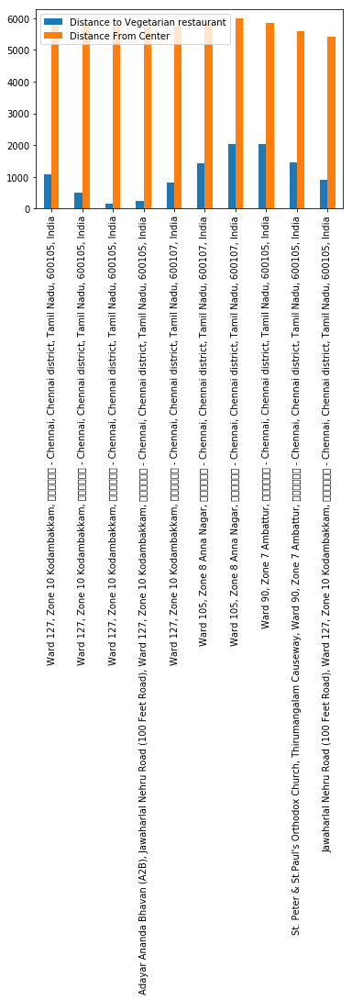

In [24]:

df_locations1 = pd.DataFrame({'Distance to Vegetarian restaurant': df_locations['Distance to Vegetarian restaurant'][:10].tolist(),'Distance From Center': df_locations['Distance from center'][:10].tolist()} , index=df_locations['Address'][:10].tolist())
df_locations1.head()
ax = df_locations1.plot.bar()

## Heat Map

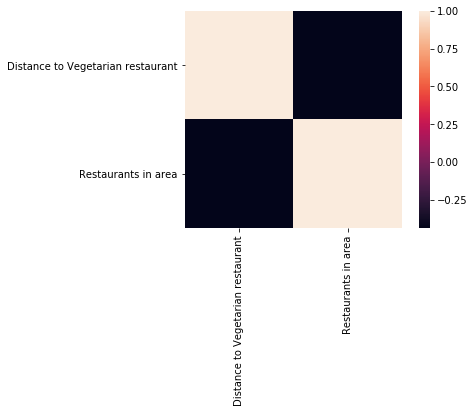

In [25]:
import seaborn as sns
from sklearn import preprocessing
cases_heatmap=df_locations[['Distance to Vegetarian restaurant', 'Distance from center', 'Restaurants in area']] #Subsetting the data
normalized_cases = preprocessing.normalize(cases_heatmap)
cor = cases_heatmap.corr() #Calculate the correlation of the above variables
cor.head()
sns.heatmap(cases_heatmap.corr(), square = True) #Plot the correlation as heat map

In [31]:
print('Average distance to closest Vegetarian restaurant from each area center:', df_locations['Distance to Vegetarian restaurant'].mean())

Average distance to closest Vegetarian restaurant from each area center: 1819.4381784383836


#### OK, so **on average Vegeterian restaurant can be found within ~500m** from every area center candidate. That's fairly close, so we need to filter our areas carefully!

#### Let's crete a map showing **heatmap / density of restaurants** and try to extract some meaningfull info from that. Also, let's show **borders of Chennai boroughs** on our map and a few circles indicating distance of 1km, 2km and 3km from Annanagar.

In [27]:
berlin_boroughs_url = 'https://raw.githubusercontent.com/m-hoerz/berlin-shapes/master/berliner-bezirke.geojson'
berlin_boroughs = requests.get(berlin_boroughs_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

In [28]:
restaurant_latlons = [[res[2], res[3]] for res in restaurants.values()]

italian_latlons = [[res[2], res[3]] for res in italian_restaurants.values()]

In [29]:
from folium import plugins
from folium.plugins import HeatMap

map_berlin = folium.Map(location=[location.latitude, location.longitude], zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_berlin) #cartodbpositron cartodbdark_matter
HeatMap(restaurant_latlons).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=1000, fill=False, color='white').add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=2000, fill=False, color='white').add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=3000, fill=False, color='white').add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

#### Looks like a few pockets of low restaurant density closest to city center can be found **north, north-east and north-west from Annanagar**. 

#### Let's create another heatmap map showing **heatmap/density of Vegeterian restaurants** only.

In [30]:
map_berlin = folium.Map(location=[location.latitude, location.longitude], zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_berlin) #cartodbpositron cartodbdark_matter
HeatMap(italian_latlons).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=1000, fill=False, color='white').add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=2000, fill=False, color='white').add_to(map_berlin)
folium.Circle(location=[location.latitude, location.longitude], radius=3000, fill=False, color='white').add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

#### This map is not so 'hot' (Vegeterian restaurants represent a subset of ~15% of all restaurants in Chennai) but it also indicates higher density of existing Vegeterian restaurants directly South and east from Annanagar, with closest pockets of **low Vegeterian restaurant density positioned north, north-east and north-west from city center**.

#### Based on this we will now focus our analysis on areas *north, north-east and north-west from Chennai (Annanagar) center* - we will move the center of our area of interest and reduce it's size to have a radius of **2.5km**. This places our location candidates mostly in boroughs Annanagar 6th avenue  (another potentially interesting borough is **Annanagar 18th Main road** with large low restaurant density north-west from city center, however this borough is less interesting to stakeholders as it's mostly residental and less popular with tourists).

### Annanagar  6th avenue

#### Analysis of the area found that the area is posh and wide road suitable for restaurants and also there is a less number of vegeterian restaurants found.

#### Customer vehicle movement will be easy as it has the wide road and it is the ideal place for leisure as the area will be calm and nearby famous roundtana park, theatre, libraries, other provisional shops available. So people visit these areas can visit our restaurant for good food.

In [31]:
roi_x_min = berlin_center_x - 500
roi_y_max = berlin_center_y + 4000
roi_width = 5000
roi_height = 5000
roi_center_x = roi_x_min + 2500
roi_center_y = roi_y_max - 2500
roi_center_lon, roi_center_lat = xy_to_lonlat(roi_center_x, roi_center_y)
roi_center = [roi_center_lat, roi_center_lon]

map_berlin = folium.Map(location=roi_center, zoom_start=14)
HeatMap(restaurant_latlons).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.4).add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1


#### this nicely covers all the pockets of low restaurant density in Annanagar 6th avenue closest to Chennai Annanagarcenter.

#### Let's also create new, more dense grid of location candidates restricted to our new region of interest (let's make our location candidates 100m appart).

In [32]:
k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_step = 100
y_step = 100 * k 
roi_y_min = roi_center_y - 2500

roi_latitudes = []
roi_longitudes = []
roi_xs = []
roi_ys = []
for i in range(0, int(51/k)):
    y = roi_y_min + i * y_step
    x_offset = 50 if i%2==0 else 0
    for j in range(0, 51):
        x = roi_x_min + j * x_step + x_offset
        d = calc_xy_distance(roi_center_x, roi_center_y, x, y)
        if (d <= 2501):
            lon, lat = xy_to_lonlat(x, y)
            roi_latitudes.append(lat)
            roi_longitudes.append(lon)
            roi_xs.append(x)
            roi_ys.append(y)

print(len(roi_latitudes), 'candidate neighborhood centers generated.')

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

2261 candidate neighborhood centers generated.


/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

OK. Now let's calculate two most important things for each location candidate: **number of restaurants in vicinity** (we'll use radius of **250 meters**) and **distance to closest Vegeterian restaurant**.

In [33]:
def count_restaurants_nearby(x, y, restaurants, radius=250):    
    count = 0
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, restaurants):
    d_min = 100000
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

roi_restaurant_counts = []
roi_italian_distances = []

print('Generating data on location candidates... ', end='')
for x, y in zip(roi_xs, roi_ys):
    count = count_restaurants_nearby(x, y, restaurants, radius=250)
    roi_restaurant_counts.append(count)
    distance = find_nearest_restaurant(x, y, italian_restaurants)
    roi_italian_distances.append(distance)
print('done.')


Generating data on location candidates... done.


In [34]:
# Let's put this into dataframe
df_roi_locations = pd.DataFrame({'Latitude':roi_latitudes,
                                 'Longitude':roi_longitudes,
                                 'X':roi_xs,
                                 'Y':roi_ys,
                                 'Restaurants nearby':roi_restaurant_counts,
                                 'Distance to Vegetarian restaurant':roi_italian_distances})

df_roi_locations.head(10)

,Latitude,Longitude,X,Y,Restaurants nearby,Distance to Vegetarian restaurant
0,13.084952,80.220627,9.413366e+06,3.242237e+06,0,1604.404468
1,13.084764,80.221009,9.413466e+06,3.242237e+06,0,1562.177795
2,13.086311,80.218691,9.412816e+06,3.242323e+06,0,1401.724629
3,13.086123,80.219073,9.412916e+06,3.242323e+06,0,1439.002045
4,13.085935,80.219455,9.413016e+06,3.242323e+06,0,1482.100482
5,13.085747,80.219838,9.413116e+06,3.242323e+06,0,1530.528272
6,13.085559,80.220220,9.413216e+06,3.242323e+06,0,1583.796623
7,13.085371,80.220602,9.413316e+06,3.242323e+06,0,1641.434341
8,13.085183,80.220984,9.413416e+06,3.242323e+06,0,1556.162725
9,13.084994,80.221366,9.413516e+06,3.242323e+06,1,1471.934906


OK. Let us now **filter** those locations: we're interested only in **locations with no more than two restaurants in radius of 250 meters**, and **no Vegeterian restaurants in radius of 400 meters**.

In [35]:
good_res_count = np.array((df_roi_locations['Restaurants nearby']<=2))
print('Locations with no more than two restaurants nearby:', good_res_count.sum())

good_ita_distance = np.array(df_roi_locations['Distance to Vegetarian restaurant']>=400)
print('Locations with no Vegetarian restaurants within 400m:', good_ita_distance.sum())

good_locations = np.logical_and(good_res_count, good_ita_distance)
print('Locations with both conditions met:', good_locations.sum())

df_good_locations = df_roi_locations[good_locations]


Locations with no more than two restaurants nearby: 2227
Locations with no Vegetarian restaurants within 400m: 2202
Locations with both conditions met: 2168


Let's see how this looks on a map.

In [37]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_berlin = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_berlin)
HeatMap(restaurant_latlons).add_to(map_berlin)
folium.Circle(roi_center, radius=500, color='white', fill=True, fill_opacity=0.6).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=4, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin) 
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

Looking good. We now have a bunch of locations fairly close to Annanagar (mostly in Annanagar 6th avenue, 1st avenue), and we know that each of those locations has no more than two restaurants in radius of 250m, and no Italian restaurant closer than 400m. Any of those locations is a potential candidate for a new Vegeterian restaurant, at least based on nearby competition.

Let's now show those good locations in a form of heatmap:

In [38]:
map_berlin = folium.Map(location=roi_center, zoom_start=14)
HeatMap(good_locations, radius=25).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

Looking good. What we have now is a clear indication of zones with low number of restaurants in vicinity, and *no* Italian restaurants at all nearby.

Let us now **cluster** those locations to create **centers of zones containing good locations**. Those zones, their centers and addresses will be the final result of our analysis. 

In [41]:
from sklearn.cluster import KMeans

number_of_clusters = 15

good_xys = df_good_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)

cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]

map_berlin = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_berlin)
HeatMap(restaurant_latlons).add_to(map_berlin)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.4).add_to(map_berlin)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=True, fill_opacity=0.25).add_to(map_berlin) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:18: DeprecationWarning: This function

Not bad - our clusters represent groupings of most of the candidate locations and cluster centers are placed nicely in the middle of the zones 'rich' with location candidates.

Addresses of those cluster centers will be a good starting point for exploring the neighborhoods to find the best possible location based on neighborhood specifics.

Let's see those zones on a city map without heatmap, using shaded areas to indicate our clusters:

In [42]:
map_berlin = folium.Map(location=roi_center, zoom_start=14)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#00000000', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(map_berlin)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(map_berlin) 
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

Let's zoom in on candidate areas in **Annanagar 6th avenue**:

In [43]:
map_berlin = folium.Map(location=[13.0919, 80.2217], zoom_start=15)
folium.Marker(location=[location.latitude, location.longitude]).add_to(map_berlin)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(map_berlin) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#0000ff00', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(map_berlin)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_berlin)
folium.GeoJson(berlin_boroughs, style_function=boroughs_style, name='geojson').add_to(map_berlin)
map_berlin

...and candidate areas in **Annanagar 6th avenue**:

This concludes our analysis. We have created 15 addresses representing centers of zones containing locations with low number of restaurants and no Vegeterian restaurants nearby, all zones being fairly close to city center (all less than 4km from Annanagar, and about half of those less than 2km from Annanagar). Although zones are shown on map with a radius of ~500 meters (green circles), their shape is actually very irregular and their centers/addresses should be considered only as a starting point for exploring area neighborhoods in search for potential restaurant locations. Most of the zones are located in Annanagar 6th avenue boroughs, which we have identified as interesting due to being popular with tourists, fairly close to city center and well connected by public transport.

## Results and Discussion <a name="results"></a>

Our analysis shows that although there is a great number of restaurants in Chennai (~2000 in our initial area of interest which was 12x12km around Annanagar), there are pockets of low restaurant density fairly close to city center. Highest concentration of restaurants was detected east, south from Annanagar, so we focused our attention to areas north, nort-west. Another borough was identified as potentially interesting (18th Main road Annanagar), but our attention was focused on Annanagar which offer a combination of popularity among tourists, closeness to city center, strong socio-economic dynamics *and* a number of pockets of low restaurant density.

After directing our attention to this more narrow area of interest (covering approx. 5x5km south-east from Annanagar) we first created a dense grid of location candidates (spaced 100m appart); those locations were then filtered so that those with more than two restaurants in radius of 250m and those with an Vegeterian restaurant closer than 400m were removed.

Those location candidates were then clustered to create zones of interest which contain greatest number of location candidates. Addresses of centers of those zones were also generated using reverse geocoding to be used as markers/starting points for more detailed local analysis based on other factors.

Result of all this is 15 zones containing largest number of potential new restaurant locations based on number of and distance to existing venues - both restaurants in general and Vegeterian restaurants particularly. This, of course, does not imply that those zones are actually optimal locations for a new restaurant! Purpose of this analysis was to only provide info on areas close to Chennai Annanagar center but not crowded with existing restaurants (particularly Vegeterian) - it is entirely possible that there is a very good reason for small number of restaurants in any of those areas, reasons which would make them unsuitable for a new restaurant regardless of lack of competition in the area. Recommended zones should therefore be considered only as a starting point for more detailed analysis which could eventually result in location which has not only no nearby competition but also other factors taken into account and all other relevant conditions met.

## Conclusion <a name="conclusion"></a>

Purpose of this project was to identify Chennai Annanagar areas close to center with low number of restaurants (particularly Vegeterian restaurants) in order to aid stakeholders in narrowing down the search for optimal location for a new Vegeterian restaurant. By calculating restaurant density distribution from Foursquare data we have first identified general boroughs that justify further analysis Annanagar 6th avenue and then generated extensive collection of locations which satisfy some basic requirements regarding existing nearby restaurants. Clustering of those locations was then performed in order to create major zones of interest (containing greatest number of potential locations) and addresses of those zone centers were created to be used as starting points for final exploration by stakeholders.

Final decission on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like attractiveness of each location (proximity to park or water), levels of noise / proximity to major roads, real estate availability, prices, social and economic dynamics of every neighborhood etc.